In [1]:
library(dplyr)
library(plotly)
library(caret)
library(broom)
library(regclass)
library(Rdatalakeclient)
library(CustomerScoringMetrics)
library(aod)
library(OneR)
library(smotefamily)
library(MLmetrics)
library(rattle)
library(ChannelAttribution)
library(stringr)



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Loading required package: lattice

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
Loading required package: bestglm

Loading required package: leaps

Loading required package: VGAM

Loading required package: stats4

Loading required package: splines


Attaching package: ‘VGAM’


The following object is masked from ‘package:caret’:

    predictors


Loading required package: rpart

Loading required package: randomForest

randomForest 4.6-14

Type rfNews() to see new

In [ ]:
campaign <- c("\'149%\'","\'150%\'","\'151%\'","\'152%\'","\'153%\'","\'154%\'","\'155%\'","\'156%\'","\'157%\'")
# campaign <- c("\'157%\'")

dm <- data.frame()

for (i in 1:(length(campaign))){
    query <- paste("select lca.personal_offer_code as poc,dm.first_name,dmc.Product,dmc.group_description AS Group_Description,dmc.creative_description AS Creative_Description, dmc.creative_code AS Creative_Code,dm.poc AS Personal_Offer_Code,dmc.Campaign_Year, dmc.Campaign_Month,dmc.Campaign_Estimated_Start, dmc.Campaign_Actual_Start,dmc.Campaign_End_Date,dmc.Campaign_Actual_End_Date ,dm.Mail_Campaigns,dm.Mail_Products,dm.Number_Of_Mailings, 
    dm.Loan_Mailings_Last_9_Sends,dm.Card_Mailings_Last_9_Sends,dm.Mailings_Last_9_Sends,
    dm.FICO_Score, dm.Loan_Response_Score, dm.Loan_Default_Score, dm.Income_Score,dm.Bankruptcy_Score,dm.Vantage_Score,dm.Months_Since_Last_CC,dm.Months_Since_Last_Credit_Inquiry,dm.Number_Of_Bank_Installment_Trades_Opened_Last_6_Months, dm.Months_On_File,dm.Open_Satisfactory_Trades,dm.Number_Of_Non_Student_Trades
    ,DATE_PART('year',lca.created_time) AS App_Year,
    DATE_PART('month',lca.created_time) AS App_Month, date_trunc('day', lca.created_time) AS App_Date,COALESCE(lca.returning_customer_status,'unknown') AS Customer_Status,
    case when 
        lca.coupon_code is not null and lca.direct_mail_flag = TRUE then 'Direct Mail' 
        WHEN UPPER(lca.source) like UPPER('%ppc%') THEN 'PPC'
        WHEN UPPER(lca.source) = UPPER('massive-email') THEN 'Massive Email'
        WHEN UPPER(lca.source) = UPPER('bmg-email') THEN 'BMG Email'
        WHEN UPPER(lca.source) = UPPER('avant_digital_prescreen_prefill') THEN 'ODS Avant'
        WHEN UPPER(lca.source) like UPPER('cc-email%') THEN 'Portfolio'
        WHEN UPPER(lca.source) like UPPER('fb-ig%') THEN 'Social Media'
        WHEN UPPER(lca.source) like UPPER('%creditkarma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) = UPPER('ck') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('%credit_karma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('lendingtree%') THEN 'Lending Tree'
        WHEN UPPER(lca.source) = UPPER('LT') THEN 'Lending Tree'
        WHEN UPPER(lca.source) like UPPER('experian%') THEN 'Experian'
        WHEN UPPER(lca.source) like UPPER('creditsesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('credit_sesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('comparecards%') THEN 'Compare Cards'
        WHEN UPPER(lca.source) like UPPER('magnifymoney%') THEN 'Magnify Money'
        WHEN UPPER(lca.source) like UPPER('nerdwallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('nerd_wallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('simpletuition%') THEN 'Simple Tuition'
        WHEN UPPER(lca.source) like UPPER('transunion%') THEN 'TransUnion'
        WHEN UPPER(lca.source) like UPPER('bankrate%') THEN 'Bank Rate'
        WHEN UPPER(lca.source) like UPPER('creditcardsdotcom%') THEN 'CreditCards.com'
        WHEN UPPER(lca.source) like UPPER('creditdotcom%') THEN 'Credit.com'
        WHEN UPPER(lca.source) like UPPER('evenfinancial%') THEN 'Evenfinancial'
        WHEN UPPER(lca.source) like UPPER('mint%') THEN 'Mint'
        WHEN UPPER(lca.source) like UPPER('turbo%') THEN 'Turbo'
        WHEN UPPER(lca.source) like UPPER('cardratings%') THEN 'Cardratings'
        WHEN UPPER(lca.source) like UPPER('lendedu%') THEN 'LendEDU'
        WHEN UPPER(lca.source) like UPPER('creditsoup%') THEN 'Credit Soup'
        WHEN UPPER(lca.source) like UPPER('wallethub%') THEN 'Wallet Hub'
        WHEN UPPER(lca.source) like UPPER('westlake%') THEN 'Westlake'
        WHEN UPPER(lca.source) like UPPER('upturn%') THEN 'Upturn'
        WHEN UPPER(lca.source) like UPPER('usnews%') THEN 'US News'
        WHEN UPPER(lca.source) like UPPER('forbes%') THEN 'Forbes'
        WHEN UPPER(lca.source) like UPPER('%simpledollar%') THEN 'The Simple Dollar'
        WHEN UPPER(lca.source) like UPPER('%mastercard%') THEN 'Mastercard'
        WHEN UPPER(lca.source) like UPPER('%massive%') THEN 'Massive'
        WHEN UPPER(lca.source) like UPPER('%google%') THEN 'Google'
        WHEN UPPER(lca.source) like UPPER('%bing%') THEN 'Bing'
        WHEN UPPER(lca.source) like UPPER('commission%') THEN 'Commission Junction'
        WHEN UPPER(lca.source) like UPPER('organic') THEN 'Organic'
        WHEN UPPER(lca.source) like UPPER('%email%') THEN 'Other Email'
        else lca.source END AS Marketing_Source, lca.loan_purpose,lca.employment_industry, lca.income_type, lca.applied_cd_monthly_net_income,
    lca.housing_ownership_type,lca.monthly_housing_payment_amount,TRUNCATE(lca.applied_cd_fico_score,-1) AS Applied_FICO_Score,lca.prefunding_dti,lca.income_model_score,lca.fraud_credit_model_score ,lca.requested_loan_amount ,
    lca.loan_amount , lca.loan_term, lca.interest_rate, lca.status AS Application_Status,
    case when lca.issued_flag = True then 1 else 0 END AS Loan_Issued, loan.loan_amount AS Total_Issuance, loan.status AS Current_Loan_Status,
    lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating,
    (EXTRACT(DAY FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))* 24)  + (EXTRACT(HOUR FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))) + (CAST(EXTRACT(MINUTE FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))AS NUMERIC)/60) AS Time_To_Issuance,
    case when lca.issuance_decision_time IS NOT NULL then 'Issued' when lca.completed_view_count > 0  then 'Completed View' when lca.enter_verification_time IS NOT NUll then 'Entered Verification' when lca.additional_information_submit_count  > 0 then 'Additional Info Submitted' when lca.additional_information_view_count  > 0 then 'Additional Info Viewed' when 
    lca.bank_account_submit_count  > 0 then 'Bank Account Submitted' when 
    lca.bank_account_view_count  > 0 then 'Bank Account Viewed' when lca.contract_submit_count  > 0 then 'Contract Submitted' when lca.contract_view_count  > 0 then 'Contract Viewed' when
    lca.rates_terms_submit_count  > 0 then 'Rates & Terms Submitted' when lca.rates_terms_view_count  > 0 then 'Rates & Terms Viewed' when lca.personal_submit_time  IS NOT NULL then 'Personal Info Submitted' when lca.personal_view_time  IS NOT NULL then 'Personal Info Viewed' else 'Immediate Bounce' END AS Last_Action_Taken,
    dm.zip_code
    from 
    (SELECT dm.creative_type, dme.timesmailed AS Mail_Campaigns,dm.timesmailed_product AS Mail_Products,COALESCE(LENGTH(regexp_replace(dme.timesmailed, '[a-zA-Z0-9]', '')) + 1,0) AS Number_Of_Mailings, 
    dme.times_mailed_loan_last_9_sends AS Loan_Mailings_Last_9_Sends,dme.times_mailed_card_last_9_sends AS Card_Mailings_Last_9_Sends,dme.times_mailed_last_9_sends AS Mailings_Last_9_Sends,
    TRUNC(dme.fico_score,-1) AS FICO_Score, TRUNC(dme.pl_response_400_score,3) AS Loan_Response_Score, TRUNC(dme.pl_default_520_score,2) AS Loan_Default_Score, TRUNC(dme.bankruptcy_200_score,2) AS Bankruptcy_Score,TRUNC(dme.income_300_score,-2) AS Income_Score,dme.cvtg03 AS Vantage_Score,dm.bc21s AS Months_Since_Last_CC,dm.g102s AS Months_Since_Last_Credit_Inquiry,dm.bi05 AS Number_Of_Bank_Installment_Trades_Opened_Last_6_Months,COALESCE(dm.g106s,0) AS Months_On_File,COALESCE(dm.at03s,0) AS Open_Satisfactory_Trades,COALESCE(dm.at01 - COALESCE(dm.st01s,0),0) AS Number_Of_Non_Student_Trades,dm.consumerid,dm.poc, dm.bpid,dm.first_name, dm.last_name,dm.address, dm.state, dm.zip_code
    from avant.prod.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm
    inner join 
    (select distinct dme.consumerid, dme.bpid,dme.timesmailed,dme.times_mailed_loan_last_9_sends,dme.times_mailed_card_last_9_sends,dme.times_mailed_last_9_sends,dme.fico_score, dme.pl_response_400_score,dme.pl_default_520_score,dme.income_300_score,dme.cvtg03, dme.bpid,dme.bankruptcy_200_score
    from avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme) as dme
    on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    where dm.creative_type LIKE", campaign[i],"
    ) as dm inner join
    (select dm.creative_code,dm.group_description,dm.creative_description,DATE_PART('year',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Year, DATE_PART('month',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Month,date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Actual_Start,TO_DATE(dmcs.drop_date,'YYYY-MM-DD') AS Campaign_Estimated_Start,COALESCE(LAG (date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))),1) OVER (ORDER BY dm.creative_code DESC),MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD'))) AS Campaign_End_Date ,MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD')) AS Campaign_Actual_End_Date,dm.product AS Product
    from avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dm 
    left join avant.prod.dw.dw_orig.cc_account_customer_application as cca 
    on cca.creative_code = dm.creative_code
    left join avant.prod.dw.dw_orig.loan_customer_application as lca
    on lca.creative_code = dm.creative_code inner join
    avant.prod.dw.dw_orig.ad_hoc.dm_metadata_campaign_segments as dmcs
    on dmcs.coupon_code = dm.creative_code
    where dm.product = 'Loan' and lca.created_time >= dmcs.drop_date 
    and dm.creative_code LIKE", campaign[i],"
    group by 1,2,3,7,10
    ) as dmc on dmc.creative_code = dm.creative_type 
    LEFT JOIN
    avant.prod.dw.dw_orig.loan_customer_application as lca 
    on (lca.personal_offer_code = dm.poc and lca.creative_code = dm.creative_type) 
    LEFT JOIN
    avant.prod.dw.dw_serv.loan on loan.loan_id = lca.loan_id left join
    (select lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.loan_customer_application_uuid
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd inner join
    (select lcd.loan_customer_application_uuid, max(lcd.created_time) as created_time
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd
    where DATE_PART('year',lcd.created_time) >= 2021
    group by 1) as l2 on l2.created_time = lcd.created_time and l2.loan_customer_application_uuid = lcd.loan_customer_application_uuid    ) as lcd on lcd.loan_customer_application_uuid = lca.loan_customer_application_uuid
    where dmc.Campaign_Year IS NOT NULL and dm.poc IS NOT NULL 
    ")
    dm.df <-Rdatalakeclient::run_query_with_lake(query, engine='dremio')

    query <- paste("select lca.personal_offer_code as poc,dm.first_name, dmc.Product,dmc.group_description AS Group_Description,dmc.creative_description AS Creative_Description, dmc.creative_code AS Creative_Code,dm.poc AS Personal_Offer_Code,dmc.Campaign_Year, dmc.Campaign_Month, dmc.Campaign_Estimated_Start, dmc.Campaign_Actual_Start,dmc.Campaign_End_Date,dmc.Campaign_Actual_End_Date ,dm.Mail_Campaigns,dm.Mail_Products,dm.Number_Of_Mailings, 
    dm.Loan_Mailings_Last_9_Sends,dm.Card_Mailings_Last_9_Sends,dm.Mailings_Last_9_Sends,
    dm.FICO_Score, dm.Loan_Response_Score, dm.Loan_Default_Score, dm.Income_Score,dm.Bankruptcy_Score,dm.Vantage_Score,dm.Months_Since_Last_CC,dm.Months_Since_Last_Credit_Inquiry,dm.Number_Of_Bank_Installment_Trades_Opened_Last_6_Months, dm.Months_On_File,dm.Open_Satisfactory_Trades,dm.Number_Of_Non_Student_Trades
    ,DATE_PART('year',lca.created_time) AS App_Year,
    DATE_PART('month',lca.created_time) AS App_Month, date_trunc('day', lca.created_time) AS App_Date, COALESCE(lca.returning_customer_status,'unknown') AS Customer_Status,
    case when 
        lca.coupon_code is not null and lca.direct_mail_flag = TRUE then 'Direct Mail' 
        WHEN UPPER(lca.source) like UPPER('%ppc%') THEN 'PPC'
        WHEN UPPER(lca.source) = UPPER('massive-email') THEN 'Massive Email'
        WHEN UPPER(lca.source) = UPPER('bmg-email') THEN 'BMG Email'
        WHEN UPPER(lca.source) = UPPER('avant_digital_prescreen_prefill') THEN 'ODS Avant'
        WHEN UPPER(lca.source) like UPPER('cc-email%') THEN 'Portfolio'
        WHEN UPPER(lca.source) like UPPER('fb-ig%') THEN 'Social Media'
        WHEN UPPER(lca.source) like UPPER('%creditkarma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) = UPPER('ck') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('%credit_karma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('lendingtree%') THEN 'Lending Tree'
        WHEN UPPER(lca.source) = UPPER('LT') THEN 'Lending Tree'
        WHEN UPPER(lca.source) like UPPER('experian%') THEN 'Experian'
        WHEN UPPER(lca.source) like UPPER('creditsesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('credit_sesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('comparecards%') THEN 'Compare Cards'
        WHEN UPPER(lca.source) like UPPER('magnifymoney%') THEN 'Magnify Money'
        WHEN UPPER(lca.source) like UPPER('nerdwallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('nerd_wallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('simpletuition%') THEN 'Simple Tuition'
        WHEN UPPER(lca.source) like UPPER('transunion%') THEN 'TransUnion'
        WHEN UPPER(lca.source) like UPPER('bankrate%') THEN 'Bank Rate'
        WHEN UPPER(lca.source) like UPPER('creditcardsdotcom%') THEN 'CreditCards.com'
        WHEN UPPER(lca.source) like UPPER('creditdotcom%') THEN 'Credit.com'
        WHEN UPPER(lca.source) like UPPER('evenfinancial%') THEN 'Evenfinancial'
        WHEN UPPER(lca.source) like UPPER('mint%') THEN 'Mint'
        WHEN UPPER(lca.source) like UPPER('turbo%') THEN 'Turbo'
        WHEN UPPER(lca.source) like UPPER('cardratings%') THEN 'Cardratings'
        WHEN UPPER(lca.source) like UPPER('lendedu%') THEN 'LendEDU'
        WHEN UPPER(lca.source) like UPPER('creditsoup%') THEN 'Credit Soup'
        WHEN UPPER(lca.source) like UPPER('wallethub%') THEN 'Wallet Hub'
        WHEN UPPER(lca.source) like UPPER('westlake%') THEN 'Westlake'
        WHEN UPPER(lca.source) like UPPER('upturn%') THEN 'Upturn'
        WHEN UPPER(lca.source) like UPPER('usnews%') THEN 'US News'
        WHEN UPPER(lca.source) like UPPER('forbes%') THEN 'Forbes'
        WHEN UPPER(lca.source) like UPPER('%simpledollar%') THEN 'The Simple Dollar'
        WHEN UPPER(lca.source) like UPPER('%mastercard%') THEN 'Mastercard'
        WHEN UPPER(lca.source) like UPPER('%massive%') THEN 'Massive'
        WHEN UPPER(lca.source) like UPPER('%google%') THEN 'Google'
        WHEN UPPER(lca.source) like UPPER('%bing%') THEN 'Bing'
        WHEN UPPER(lca.source) like UPPER('commission%') THEN 'Commission Junction'
        WHEN UPPER(lca.source) like UPPER('organic') THEN 'Organic'
        WHEN UPPER(lca.source) like UPPER('%email%') THEN 'Other Email'
        else lca.source END AS Marketing_Source, lca.loan_purpose,lca.employment_industry, lca.income_type, lca.applied_cd_monthly_net_income,
    lca.housing_ownership_type,lca.monthly_housing_payment_amount,TRUNCATE(lca.applied_cd_fico_score,-1) AS Applied_FICO_Score,lca.prefunding_dti,lca.income_model_score,lca.fraud_credit_model_score ,lca.requested_loan_amount ,
    lca.loan_amount , lca.loan_term, lca.interest_rate, lca.status AS Application_Status,
    case when lca.issued_flag = True then 1 else 0 END AS Loan_Issued, loan.loan_amount AS Total_Issuance, loan.status AS Current_Loan_Status,
    lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating,
    (EXTRACT(DAY FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))* 24)  + (EXTRACT(HOUR FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))) + (CAST(EXTRACT(MINUTE FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))AS NUMERIC)/60) AS Time_To_Issuance,
    case when lca.issuance_decision_time IS NOT NULL then 'Issued' when lca.completed_view_count > 0  then 'Completed View' when lca.enter_verification_time IS NOT NUll then 'Entered Verification' when lca.additional_information_submit_count  > 0 then 'Additional Info Submitted' when lca.additional_information_view_count  > 0 then 'Additional Info Viewed' when 
    lca.bank_account_submit_count  > 0 then 'Bank Account Submitted' when 
    lca.bank_account_view_count  > 0 then 'Bank Account Viewed' when lca.contract_submit_count  > 0 then 'Contract Submitted' when lca.contract_view_count  > 0 then 'Contract Viewed' when
    lca.rates_terms_submit_count  > 0 then 'Rates & Terms Submitted' when lca.rates_terms_view_count  > 0 then 'Rates & Terms Viewed' when lca.personal_submit_time  IS NOT NULL then 'Personal Info Submitted' when lca.personal_view_time  IS NOT NULL then 'Personal Info Viewed' else 'Immediate Bounce' END AS Last_Action_Taken,
    dm.zip_code
    from 
    (SELECT dm.creative_type, dme.timesmailed AS Mail_Campaigns,dm.timesmailed_product AS Mail_Products,COALESCE(LENGTH(regexp_replace(dme.timesmailed, '[a-zA-Z0-9]', '')) + 1,0) AS Number_Of_Mailings, 
    dme.times_mailed_loan_last_9_sends AS Loan_Mailings_Last_9_Sends,dme.times_mailed_card_last_9_sends AS Card_Mailings_Last_9_Sends,dme.times_mailed_last_9_sends AS Mailings_Last_9_Sends,
    TRUNC(dme.fico_score,-1) AS FICO_Score, TRUNC(dme.pl_response_400_score,3) AS Loan_Response_Score, TRUNC(dme.pl_default_520_score,2) AS Loan_Default_Score, TRUNC(dme.bankruptcy_200_score,2) AS Bankruptcy_Score,TRUNC(dme.income_300_score,-2) AS Income_Score,dme.cvtg03 AS Vantage_Score,dm.bc21s AS Months_Since_Last_CC,dm.g102s AS Months_Since_Last_Credit_Inquiry,dm.bi05 AS Number_Of_Bank_Installment_Trades_Opened_Last_6_Months,COALESCE(dm.g106s,0) AS Months_On_File,COALESCE(dm.at03s,0) AS Open_Satisfactory_Trades,COALESCE(dm.at01 - COALESCE(dm.st01s,0),0) AS Number_Of_Non_Student_Trades,dm.consumerid,dm.poc, dm.bpid,dm.first_name, dm.last_name,dm.address, dm.state, dm.zip_code,dm.ssn8
    from avant.prod.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm
    inner join 
    (select distinct dme.consumerid, dme.bpid,dme.timesmailed,dme.times_mailed_loan_last_9_sends,dme.times_mailed_card_last_9_sends,dme.times_mailed_last_9_sends,dme.fico_score, dme.pl_response_400_score,dme.pl_default_520_score,dme.income_300_score,dme.cvtg03, dme.bpid,dme.bankruptcy_200_score
    from avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme) as dme
    on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    where dm.creative_type LIKE", campaign[i],
    ") as dm inner join
    (select dm.creative_code,dm.group_description,dm.creative_description,DATE_PART('year',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Year, DATE_PART('month',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Month,date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Actual_Start,TO_DATE(dmcs.drop_date,'YYYY-MM-DD') AS Campaign_Estimated_Start,COALESCE(LAG (date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))),1) OVER (ORDER BY dm.creative_code DESC),MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD'))) AS Campaign_End_Date ,MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD')) AS Campaign_Actual_End_Date,dm.product AS Product
    from avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dm 
    left join avant.prod.dw.dw_orig.cc_account_customer_application as cca 
    on cca.creative_code = dm.creative_code
    left join avant.prod.dw.dw_orig.loan_customer_application as lca
    on lca.creative_code = dm.creative_code inner join
    avant.prod.dw.dw_orig.ad_hoc.dm_metadata_campaign_segments as dmcs
    on dmcs.coupon_code = dm.creative_code
    where dm.product = 'Loan' and lca.created_time >= dmcs.drop_date and dm.creative_code LIKE" , campaign[i],
    "group by 1,2,3,7,10
    ) as dmc on dmc.creative_code = dm.creative_type 
    LEFT JOIN
    avant.prod.dw.dw_orig.loan_customer_application as lca 
    on (dm.first_name = lca.first_name and  dm.last_name = lca.last_name and dm.state = lca.address_state and  dm.ssn8 = lca.ssn_last_4 and lca.personal_offer_code IS NULL )
    LEFT JOIN
    avant.prod.dw.dw_serv.loan on loan.loan_id = lca.loan_id left join
    (select lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.loan_customer_application_uuid
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd inner join
    (select lcd.loan_customer_application_uuid, max(lcd.created_time) as created_time
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd
    where DATE_PART('year',lcd.created_time) >= 2021
    group by 1) as l2 on l2.created_time = lcd.created_time and l2.loan_customer_application_uuid = lcd.loan_customer_application_uuid    ) as lcd on lcd.loan_customer_application_uuid = lca.loan_customer_application_uuid
    where dmc.Campaign_Year IS NOT NULL and dm.first_name = lca.first_name and  dm.last_name = lca.last_name and dm.state = lca.address_state and  dm.ssn8 = lca.ssn_last_4  and lca.created_time >= dmc.Campaign_Estimated_Start and lca.created_time < dmc.Campaign_End_Date
    ")

    dm.df2 <-Rdatalakeclient::run_query_with_lake(query, engine='dremio')

    dm.df <- rbind(dm.df,dm.df2)
    rm(dm.df2)
    dm.df <- dm.df[order(dm.df$Creative_Code, dm.df$Personal_Offer_Code,dm.df$poc, dm.df$Total_Issuance,dm.df$App_Year,rowSums(is.na(dm.df))),]
    dm.df <- dm.df[!duplicated(dm.df[,c(6,7)]),]
    dm <- rbind(dm, dm.df)
}

In [4]:

dm <- data.frame()

query <- paste("select lca.personal_offer_code as poc,dm.first_name,dmc.Product,dmc.group_description AS Group_Description,dmc.creative_description AS Creative_Description, dmc.creative_code AS Creative_Code,dm.poc AS Personal_Offer_Code,dmc.Campaign_Year, dmc.Campaign_Month,dmc.Campaign_Estimated_Start, dmc.Campaign_Actual_Start,dmc.Campaign_End_Date,dmc.Campaign_Actual_End_Date ,dm.Mail_Campaigns,dm.Mail_Products,dm.Number_Of_Mailings, 
    dm.Loan_Mailings_Last_9_Sends,dm.Card_Mailings_Last_9_Sends,dm.Mailings_Last_9_Sends,
    dm.FICO_Score, dm.Loan_Response_Score, dm.Loan_Default_Score, dm.Income_Score,dm.Bankruptcy_Score,dm.Vantage_Score,dm.Months_Since_Last_CC,dm.Months_Since_Last_Credit_Inquiry,dm.Number_Of_Bank_Installment_Trades_Opened_Last_6_Months, dm.Months_On_File,dm.Open_Satisfactory_Trades,dm.Number_Of_Non_Student_Trades
    ,dm.Total_Revolving_Banking_Balance, dm.Monthly_Payment_On_Revolving_Balance, dm.Total_Revolving_Finance_Balance,dm.Total_Revolving_Balance, dm.Total_Trade_Balance, dm.Months_Since_Most_Recent_Trade
    ,DATE_PART('year',lca.created_time) AS App_Year,
    DATE_PART('month',lca.created_time) AS App_Month, date_trunc('day', lca.created_time) AS App_Date,COALESCE(lca.returning_customer_status,'unknown') AS Customer_Status,
    case when 
        lca.coupon_code is not null and lca.direct_mail_flag = TRUE then 'Direct Mail' 
        WHEN UPPER(lca.source) like UPPER('%ppc%') THEN 'PPC'
        WHEN UPPER(lca.source) = UPPER('massive-email') THEN 'Massive Email'
        WHEN UPPER(lca.source) = UPPER('bmg-email') THEN 'BMG Email'
        WHEN UPPER(lca.source) = UPPER('avant_digital_prescreen_prefill') THEN 'ODS Avant'
        WHEN UPPER(lca.source) like UPPER('cc-email%') THEN 'Portfolio'
        WHEN UPPER(lca.source) like UPPER('fb-ig%') THEN 'Social Media'
        WHEN UPPER(lca.source) like UPPER('%creditkarma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) = UPPER('ck') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('%credit_karma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('lendingtree%') THEN 'Lending Tree'
        WHEN UPPER(lca.source) = UPPER('LT') THEN 'Lending Tree'
        WHEN UPPER(lca.source) like UPPER('experian%') THEN 'Experian'
        WHEN UPPER(lca.source) like UPPER('creditsesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('credit_sesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('comparecards%') THEN 'Compare Cards'
        WHEN UPPER(lca.source) like UPPER('magnifymoney%') THEN 'Magnify Money'
        WHEN UPPER(lca.source) like UPPER('nerdwallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('nerd_wallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('simpletuition%') THEN 'Simple Tuition'
        WHEN UPPER(lca.source) like UPPER('transunion%') THEN 'TransUnion'
        WHEN UPPER(lca.source) like UPPER('bankrate%') THEN 'Bank Rate'
        WHEN UPPER(lca.source) like UPPER('creditcardsdotcom%') THEN 'CreditCards.com'
        WHEN UPPER(lca.source) like UPPER('creditdotcom%') THEN 'Credit.com'
        WHEN UPPER(lca.source) like UPPER('evenfinancial%') THEN 'Evenfinancial'
        WHEN UPPER(lca.source) like UPPER('mint%') THEN 'Mint'
        WHEN UPPER(lca.source) like UPPER('turbo%') THEN 'Turbo'
        WHEN UPPER(lca.source) like UPPER('cardratings%') THEN 'Cardratings'
        WHEN UPPER(lca.source) like UPPER('lendedu%') THEN 'LendEDU'
        WHEN UPPER(lca.source) like UPPER('creditsoup%') THEN 'Credit Soup'
        WHEN UPPER(lca.source) like UPPER('wallethub%') THEN 'Wallet Hub'
        WHEN UPPER(lca.source) like UPPER('westlake%') THEN 'Westlake'
        WHEN UPPER(lca.source) like UPPER('upturn%') THEN 'Upturn'
        WHEN UPPER(lca.source) like UPPER('usnews%') THEN 'US News'
        WHEN UPPER(lca.source) like UPPER('forbes%') THEN 'Forbes'
        WHEN UPPER(lca.source) like UPPER('%simpledollar%') THEN 'The Simple Dollar'
        WHEN UPPER(lca.source) like UPPER('%mastercard%') THEN 'Mastercard'
        WHEN UPPER(lca.source) like UPPER('%massive%') THEN 'Massive'
        WHEN UPPER(lca.source) like UPPER('%google%') THEN 'Google'
        WHEN UPPER(lca.source) like UPPER('%bing%') THEN 'Bing'
        WHEN UPPER(lca.source) like UPPER('commission%') THEN 'Commission Junction'
        WHEN UPPER(lca.source) like UPPER('organic') THEN 'Organic'
        WHEN UPPER(lca.source) like UPPER('%email%') THEN 'Other Email'
        else lca.source END AS Marketing_Source, lca.loan_purpose,lca.employment_industry, lca.income_type, lca.applied_cd_monthly_net_income,
    lca.housing_ownership_type,lca.monthly_housing_payment_amount,TRUNCATE(lca.applied_cd_fico_score,-1) AS Applied_FICO_Score,lca.prefunding_dti,lca.income_model_score,lca.fraud_credit_model_score ,lca.requested_loan_amount ,
    lca.loan_amount , lca.loan_term, lca.interest_rate, lca.status AS Application_Status,
    case when lca.issued_flag = True then 1 else 0 END AS Loan_Issued, loan.loan_amount AS Total_Issuance, loan.status AS Current_Loan_Status, 
    lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.eligibility_approved_flag, lcd.credit_approved_flag, lcd.product_approved_flag,
    (EXTRACT(DAY FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))* 24)  + (EXTRACT(HOUR FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))) + (CAST(EXTRACT(MINUTE FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))AS NUMERIC)/60) AS Time_To_Issuance,
    case when lca.issuance_decision_time IS NOT NULL then 'Issued' when lca.completed_view_count > 0  then 'Completed View' when lca.enter_verification_time IS NOT NUll then 'Entered Verification' when lca.additional_information_submit_count  > 0 then 'Additional Info Submitted' when lca.additional_information_view_count  > 0 then 'Additional Info Viewed' when 
    lca.bank_account_submit_count  > 0 then 'Bank Account Submitted' when 
    lca.bank_account_view_count  > 0 then 'Bank Account Viewed' when lca.contract_submit_count  > 0 then 'Contract Submitted' when lca.contract_view_count  > 0 then 'Contract Viewed' when
    lca.rates_terms_submit_count  > 0 then 'Rates & Terms Submitted' when lca.rates_terms_view_count  > 0 then 'Rates & Terms Viewed' when lca.personal_submit_time  IS NOT NULL then 'Personal Info Submitted' when lca.personal_view_time  IS NOT NULL then 'Personal Info Viewed' else 'Immediate Bounce' END AS Last_Action_Taken,
    dm.zip_code
    from 
    (SELECT dm.creative_type, dme.timesmailed AS Mail_Campaigns,dm.timesmailed_product AS Mail_Products,COALESCE(LENGTH(regexp_replace(dme.timesmailed, '[a-zA-Z0-9]', '')) + 1,0) AS Number_Of_Mailings, 
    dme.times_mailed_loan_last_9_sends AS Loan_Mailings_Last_9_Sends,dme.times_mailed_card_last_9_sends AS Card_Mailings_Last_9_Sends,dme.times_mailed_last_9_sends AS Mailings_Last_9_Sends,
    TRUNC(dme.fico_score,-1) AS FICO_Score, TRUNC(dme.pl_response_400_score,3) AS Loan_Response_Score, TRUNC(dme.pl_default_520_score,2) AS Loan_Default_Score, TRUNC(dme.bankruptcy_200_score,2) AS Bankruptcy_Score,TRUNC(dme.income_300_score,-2) AS Income_Score,dme.cvtg03 AS Vantage_Score,dm.bc21s AS Months_Since_Last_CC,dm.g102s AS Months_Since_Last_Credit_Inquiry,dm.bi05 AS Number_Of_Bank_Installment_Trades_Opened_Last_6_Months,COALESCE(dm.g106s,0) AS Months_On_File,COALESCE(dm.at03s,0) AS Open_Satisfactory_Trades,COALESCE(dm.at01 - COALESCE(dm.st01s,0),0) AS Number_Of_Non_Student_Trades,dm.consumerid,dm.poc, dm.bpid,dm.first_name, dm.last_name,dm.address, dm.state, dm.zip_code,
    COALESCE(dm.br33,0) as Total_Revolving_Banking_Balance, COALESCE(dm.attr16,0) AS Monthly_Payment_On_Revolving_Balance, COALESCE(dm.fr33,0) Total_Revolving_Finance_Balance,COALESCE(dm.re33,0) as Total_Revolving_Balance, COALESCE(dm.at99,0) as Total_Trade_Balance, COALESCE(dm.at21,0) as Months_Since_Most_Recent_Trade
    from avant.prod.intermediate.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm
    inner join 
    (select distinct dme.consumerid, dme.bpid,dme.timesmailed,dme.times_mailed_loan_last_9_sends,dme.times_mailed_card_last_9_sends,dme.times_mailed_last_9_sends,dme.fico_score, dme.pl_response_400_score,dme.pl_default_520_score,dme.income_300_score,dme.cvtg03, dme.bpid,dme.bankruptcy_200_score
    from avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme) as dme
    on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    ) as dm inner join
    (select dm.creative_code,dm.group_description,dm.creative_description,DATE_PART('year',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Year, DATE_PART('month',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Month,date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Actual_Start,TO_DATE(dmcs.drop_date,'YYYY-MM-DD') AS Campaign_Estimated_Start,COALESCE(LAG (date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))),1) OVER (ORDER BY dm.creative_code DESC),MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD'))) AS Campaign_End_Date ,MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD')) AS Campaign_Actual_End_Date,dm.product AS Product
    from avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dm 
    left join avant.prod.dw.dw_orig.cc_account_customer_application as cca 
    on cca.creative_code = dm.creative_code
    left join avant.prod.dw.dw_orig.loan_customer_application as lca
    on lca.creative_code = dm.creative_code inner join
    avant.prod.dw.dw_orig.ad_hoc.dm_metadata_campaign_segments as dmcs
    on dmcs.coupon_code = dm.creative_code
    where dm.product = 'Loan' and lca.created_time >= dmcs.drop_date 
    group by 1,2,3,7,10
    ) as dmc on dmc.creative_code = dm.creative_type 
    LEFT JOIN
    avant.prod.intermediate.dw.dw_orig.loan_customer_application as lca 
    on (lca.personal_offer_code = dm.poc and lca.creative_code = dm.creative_type) 
    LEFT JOIN
    avant.prod.dw.dw_serv.loan on loan.loan_id = lca.loan_id left join
    (select lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.loan_customer_application_uuid,lcd.eligibility_approved_flag, lcd.credit_approved_flag, lcd.product_approved_flag
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd inner join
    (select lcd.loan_customer_application_uuid, max(lcd.created_time) as created_time
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd
    where DATE_PART('year',lcd.created_time) >= 2021
    group by 1) as l2 on l2.created_time = lcd.created_time and l2.loan_customer_application_uuid = lcd.loan_customer_application_uuid    ) as lcd on lcd.loan_customer_application_uuid = lca.loan_customer_application_uuid
    where dmc.Campaign_Year IS NOT NULL and dm.poc IS NOT NULL 
    ")
    dm.df <-Rdatalakeclient::run_query_with_lake(query, engine='dremio')

    query <- paste("select lca.personal_offer_code as poc,dm.first_name, dmc.Product,dmc.group_description AS Group_Description,dmc.creative_description AS Creative_Description, dmc.creative_code AS Creative_Code,dm.poc AS Personal_Offer_Code,dmc.Campaign_Year, dmc.Campaign_Month, dmc.Campaign_Estimated_Start, dmc.Campaign_Actual_Start,dmc.Campaign_End_Date,dmc.Campaign_Actual_End_Date ,dm.Mail_Campaigns,dm.Mail_Products,dm.Number_Of_Mailings, 
    dm.Loan_Mailings_Last_9_Sends,dm.Card_Mailings_Last_9_Sends,dm.Mailings_Last_9_Sends,
    dm.FICO_Score, dm.Loan_Response_Score, dm.Loan_Default_Score, dm.Income_Score,dm.Bankruptcy_Score,dm.Vantage_Score,dm.Months_Since_Last_CC,dm.Months_Since_Last_Credit_Inquiry,dm.Number_Of_Bank_Installment_Trades_Opened_Last_6_Months, dm.Months_On_File,dm.Open_Satisfactory_Trades,dm.Number_Of_Non_Student_Trades
    ,dm.Total_Revolving_Banking_Balance, dm.Monthly_Payment_On_Revolving_Balance, dm.Total_Revolving_Finance_Balance,dm.Total_Revolving_Balance, dm.Total_Trade_Balance, dm.Months_Since_Most_Recent_Trade
    ,DATE_PART('year',lca.created_time) AS App_Year,
    DATE_PART('month',lca.created_time) AS App_Month, date_trunc('day', lca.created_time) AS App_Date, COALESCE(lca.returning_customer_status,'unknown') AS Customer_Status,
    case when 
        lca.coupon_code is not null and lca.direct_mail_flag = TRUE then 'Direct Mail' 
        WHEN UPPER(lca.source) like UPPER('%ppc%') THEN 'PPC'
        WHEN UPPER(lca.source) = UPPER('massive-email') THEN 'Massive Email'
        WHEN UPPER(lca.source) = UPPER('bmg-email') THEN 'BMG Email'
        WHEN UPPER(lca.source) = UPPER('avant_digital_prescreen_prefill') THEN 'ODS Avant'
        WHEN UPPER(lca.source) like UPPER('cc-email%') THEN 'Portfolio'
        WHEN UPPER(lca.source) like UPPER('fb-ig%') THEN 'Social Media'
        WHEN UPPER(lca.source) like UPPER('%creditkarma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) = UPPER('ck') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('%credit_karma%') THEN 'Credit Karma'
        WHEN UPPER(lca.source) like UPPER('lendingtree%') THEN 'Lending Tree'
        WHEN UPPER(lca.source) = UPPER('LT') THEN 'Lending Tree'
        WHEN UPPER(lca.source) like UPPER('experian%') THEN 'Experian'
        WHEN UPPER(lca.source) like UPPER('creditsesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('credit_sesame%') THEN 'Credit Sesame'
        WHEN UPPER(lca.source) like UPPER('comparecards%') THEN 'Compare Cards'
        WHEN UPPER(lca.source) like UPPER('magnifymoney%') THEN 'Magnify Money'
        WHEN UPPER(lca.source) like UPPER('nerdwallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('nerd_wallet%') THEN 'Nerd Wallet'
        WHEN UPPER(lca.source) like UPPER('simpletuition%') THEN 'Simple Tuition'
        WHEN UPPER(lca.source) like UPPER('transunion%') THEN 'TransUnion'
        WHEN UPPER(lca.source) like UPPER('bankrate%') THEN 'Bank Rate'
        WHEN UPPER(lca.source) like UPPER('creditcardsdotcom%') THEN 'CreditCards.com'
        WHEN UPPER(lca.source) like UPPER('creditdotcom%') THEN 'Credit.com'
        WHEN UPPER(lca.source) like UPPER('evenfinancial%') THEN 'Evenfinancial'
        WHEN UPPER(lca.source) like UPPER('mint%') THEN 'Mint'
        WHEN UPPER(lca.source) like UPPER('turbo%') THEN 'Turbo'
        WHEN UPPER(lca.source) like UPPER('cardratings%') THEN 'Cardratings'
        WHEN UPPER(lca.source) like UPPER('lendedu%') THEN 'LendEDU'
        WHEN UPPER(lca.source) like UPPER('creditsoup%') THEN 'Credit Soup'
        WHEN UPPER(lca.source) like UPPER('wallethub%') THEN 'Wallet Hub'
        WHEN UPPER(lca.source) like UPPER('westlake%') THEN 'Westlake'
        WHEN UPPER(lca.source) like UPPER('upturn%') THEN 'Upturn'
        WHEN UPPER(lca.source) like UPPER('usnews%') THEN 'US News'
        WHEN UPPER(lca.source) like UPPER('forbes%') THEN 'Forbes'
        WHEN UPPER(lca.source) like UPPER('%simpledollar%') THEN 'The Simple Dollar'
        WHEN UPPER(lca.source) like UPPER('%mastercard%') THEN 'Mastercard'
        WHEN UPPER(lca.source) like UPPER('%massive%') THEN 'Massive'
        WHEN UPPER(lca.source) like UPPER('%google%') THEN 'Google'
        WHEN UPPER(lca.source) like UPPER('%bing%') THEN 'Bing'
        WHEN UPPER(lca.source) like UPPER('commission%') THEN 'Commission Junction'
        WHEN UPPER(lca.source) like UPPER('organic') THEN 'Organic'
        WHEN UPPER(lca.source) like UPPER('%email%') THEN 'Other Email'
        else lca.source END AS Marketing_Source, lca.loan_purpose,lca.employment_industry, lca.income_type, lca.applied_cd_monthly_net_income,
    lca.housing_ownership_type,lca.monthly_housing_payment_amount,TRUNCATE(lca.applied_cd_fico_score,-1) AS Applied_FICO_Score,lca.prefunding_dti,lca.income_model_score,lca.fraud_credit_model_score ,lca.requested_loan_amount ,
    lca.loan_amount , lca.loan_term, lca.interest_rate, lca.status AS Application_Status,
    case when lca.issued_flag = True then 1 else 0 END AS Loan_Issued, loan.loan_amount AS Total_Issuance, loan.status AS Current_Loan_Status,
    lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.eligibility_approved_flag, lcd.credit_approved_flag, lcd.product_approved_flag,
    (EXTRACT(DAY FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))* 24)  + (EXTRACT(HOUR FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))) + (CAST(EXTRACT(MINUTE FROM DATE_SUB(lca.issuance_decision_time, lca.created_time))AS NUMERIC)/60) AS Time_To_Issuance,
    case when lca.issuance_decision_time IS NOT NULL then 'Issued' when lca.completed_view_count > 0  then 'Completed View' when lca.enter_verification_time IS NOT NUll then 'Entered Verification' when lca.additional_information_submit_count  > 0 then 'Additional Info Submitted' when lca.additional_information_view_count  > 0 then 'Additional Info Viewed' when 
    lca.bank_account_submit_count  > 0 then 'Bank Account Submitted' when 
    lca.bank_account_view_count  > 0 then 'Bank Account Viewed' when lca.contract_submit_count  > 0 then 'Contract Submitted' when lca.contract_view_count  > 0 then 'Contract Viewed' when
    lca.rates_terms_submit_count  > 0 then 'Rates & Terms Submitted' when lca.rates_terms_view_count  > 0 then 'Rates & Terms Viewed' when lca.personal_submit_time  IS NOT NULL then 'Personal Info Submitted' when lca.personal_view_time  IS NOT NULL then 'Personal Info Viewed' else 'Immediate Bounce' END AS Last_Action_Taken,
    dm.zip_code
    from 
    (SELECT dm.creative_type, dme.timesmailed AS Mail_Campaigns,dm.timesmailed_product AS Mail_Products,COALESCE(LENGTH(regexp_replace(dme.timesmailed, '[a-zA-Z0-9]', '')) + 1,0) AS Number_Of_Mailings, 
    dme.times_mailed_loan_last_9_sends AS Loan_Mailings_Last_9_Sends,dme.times_mailed_card_last_9_sends AS Card_Mailings_Last_9_Sends,dme.times_mailed_last_9_sends AS Mailings_Last_9_Sends,
    TRUNC(dme.fico_score,-1) AS FICO_Score, TRUNC(dme.pl_response_400_score,3) AS Loan_Response_Score, TRUNC(dme.pl_default_520_score,2) AS Loan_Default_Score, TRUNC(dme.bankruptcy_200_score,2) AS Bankruptcy_Score,TRUNC(dme.income_300_score,-2) AS Income_Score,dme.cvtg03 AS Vantage_Score,dm.bc21s AS Months_Since_Last_CC,dm.g102s AS Months_Since_Last_Credit_Inquiry,dm.bi05 AS Number_Of_Bank_Installment_Trades_Opened_Last_6_Months,COALESCE(dm.g106s,0) AS Months_On_File,COALESCE(dm.at03s,0) AS Open_Satisfactory_Trades,COALESCE(dm.at01 - COALESCE(dm.st01s,0),0) AS Number_Of_Non_Student_Trades,dm.consumerid,dm.poc, dm.bpid,dm.first_name, dm.last_name,dm.address, dm.state, dm.zip_code,dm.ssn8,
    COALESCE(dm.br33,0) as Total_Revolving_Banking_Balance, COALESCE(dm.attr16,0) AS Monthly_Payment_On_Revolving_Balance, COALESCE(dm.fr33,0) Total_Revolving_Finance_Balance,COALESCE(dm.re33,0) as Total_Revolving_Balance, COALESCE(dm.at99,0) as Total_Trade_Balance, COALESCE(dm.at21,0) as Months_Since_Most_Recent_Trade
    from avant.prod.intermediate.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm
    inner join 
    (select distinct dme.consumerid, dme.bpid,dme.timesmailed,dme.times_mailed_loan_last_9_sends,dme.times_mailed_card_last_9_sends,dme.times_mailed_last_9_sends,dme.fico_score, dme.pl_response_400_score,dme.pl_default_520_score,dme.income_300_score,dme.cvtg03, dme.bpid,dme.bankruptcy_200_score
    from avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme) as dme
    on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    ) as dm inner join
    (select dm.creative_code,dm.group_description,dm.creative_description,DATE_PART('year',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Year, DATE_PART('month',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Month,date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))) AS Campaign_Actual_Start,TO_DATE(dmcs.drop_date,'YYYY-MM-DD') AS Campaign_Estimated_Start,COALESCE(LAG (date_trunc('day',MIN(COALESCE(lca.created_time,cca.created_time))),1) OVER (ORDER BY dm.creative_code DESC),MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD'))) AS Campaign_End_Date ,MAX(TO_DATE(dmcs.end_date,'YYYY-MM-DD')) AS Campaign_Actual_End_Date,dm.product AS Product
    from avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dm 
    left join avant.prod.dw.dw_orig.cc_account_customer_application as cca 
    on cca.creative_code = dm.creative_code
    left join avant.prod.dw.dw_orig.loan_customer_application as lca
    on lca.creative_code = dm.creative_code inner join
    avant.prod.dw.dw_orig.ad_hoc.dm_metadata_campaign_segments as dmcs
    on dmcs.coupon_code = dm.creative_code
    where dm.product = 'Loan' and lca.created_time >= dmcs.drop_date
    group by 1,2,3,7,10
    ) as dmc on dmc.creative_code = dm.creative_type 
    LEFT JOIN
    avant.prod.intermediate.dw.dw_orig.loan_customer_application as lca 
    on (dm.first_name = lca.first_name and  dm.last_name = lca.last_name and dm.state = lca.address_state and  dm.ssn8 = lca.ssn_last_4 and lca.personal_offer_code IS NULL )
    LEFT JOIN
    avant.prod.dw.dw_serv.loan on loan.loan_id = lca.loan_id left join
    (select lcd.credit_decline_reasons, lcd.product_decline_reasons, lcd.eligibility_decline_reasons,  lcd.risk_segment, lcd.product_rating, lcd.loan_customer_application_uuid,lcd.eligibility_approved_flag, lcd.credit_approved_flag, lcd.product_approved_flag
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd inner join
    (select lcd.loan_customer_application_uuid, max(lcd.created_time) as created_time
    from avant.prod.dw.dw_orig.loan_credit_decision as lcd
    where DATE_PART('year',lcd.created_time) >= 2021
    group by 1) as l2 on l2.created_time = lcd.created_time and l2.loan_customer_application_uuid = lcd.loan_customer_application_uuid    ) as lcd on lcd.loan_customer_application_uuid = lca.loan_customer_application_uuid
    where dmc.Campaign_Year IS NOT NULL and dm.first_name = lca.first_name and  dm.last_name = lca.last_name and dm.state = lca.address_state and  dm.ssn8 = lca.ssn_last_4  and lca.created_time >= dmc.Campaign_Estimated_Start and lca.created_time < dmc.Campaign_End_Date
    ")

dm.df2 <-Rdatalakeclient::run_query_with_lake(query, engine='dremio')

dm.df <- rbind(dm.df,dm.df2)
rm(dm.df2)
dm.df <- dm.df[order(dm.df$Creative_Code, dm.df$Personal_Offer_Code,dm.df$poc, dm.df$Total_Issuance,dm.df$App_Year,rowSums(is.na(dm.df))),]
dm.df <- dm.df[!duplicated(dm.df[,c(6,7)]),]


connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio



In [3]:
###Bring in flat file
setwd(dir = '/home/jovyan/Matthew/DM Loan/Outputs')
dm.df <- read.csv("Historical Campaign Data.csv", stringsAsFactors = FALSE, na.strings = c(""," ","NA"))
names.list <- names(dm.df)
names.list <- gsub("[.]"," ",names.list)
names(dm.df) <- names.list
head(dm.df)

,poc,first_name,Product,Group_Description,Creative_Description,Creative_Code,Personal_Offer_Code,Campaign_Year,Campaign_Month,Campaign_Estimated_Start,⋯,Projected_Loan_With_Interest,Projected_Monthly_Payment,credit_decline_reasons,product_decline_reasons,eligibility_decline_reasons,risk_segment,product_rating,Time_To_Issuance,Last_Action_Taken,zip_code
,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>
1,NA,ALEXANDER,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826813533,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,15825
2,NA,KENNETH,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826813574,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,20772
3,NA,AMY,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839084,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,43016
4,NA,LAURA,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839200,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,87031
5,NA,JENNIFER,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839217,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,93021
6,NA,PAMELA,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826904550,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,76528


In [3]:

dm5 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm5) <- c("Campaign","Explicit Reporting Cost")
dm6 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year)  & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm6) <- c("Campaign","Fuzzy Reporting Cost")
NROW(dm.df)

ERROR: Error in aggregate.data.frame(as.data.frame(x), ...): no rows to aggregate


In [ ]:
dm.df$App_Date <- as.Date(dm.df$App_Date,"%Y-%m-%d")
dm1 <- as.data.frame(aggregate(dm.df$Creative_Code, by = list(dm.df$Creative_Code), FUN = function(x){count = NROW(x)}))
names(dm1) <- c("Campaign","Sends")
dm2 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = NROW(x)}))
names(dm2) <- c("Campaign","Explicit Responses")
dm2a <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = NROW(x)}))
names(dm2a) <- c("Campaign","Fuzzy Responses")
dm3 <- as.data.frame(aggregate(dm.df$Loan_Issued[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3) <- c("Campaign","Explicit Issuances")
dm3a <- as.data.frame(aggregate(dm.df$Loan_Issued[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3a) <- c("Campaign","Fuzzy Issuances")
dm4 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4) <- c("Campaign","Explicit Issuance Amount")
dm4a <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4a) <- c("Campaign","Fuzzy Issuance Amount")
dm1 <- merge(dm1, dm2, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm2a, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm3, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm3a, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm4, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm4a, by = "Campaign",all.x = TRUE)
dm1$`Total Mailing Cost` <- dm1$Sends * 0.4
dm5 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm5) <- c("Campaign","Explicit Reporting Cost")
dm6 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm6) <- c("Campaign","Fuzzy Reporting Cost")
dm1 <- merge(dm1, dm5, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm6, by = "Campaign",all.x = TRUE)
dm1$`Explicit Reporting Cost` <- dm1$`Explicit Reporting Cost` * 4
dm1$`Fuzzy Reporting Cost` <- dm1$`Fuzzy Reporting Cost` * 4
dm1$`Explicit CPF` <- (dm1$`Total Mailing Cost` + dm1$`Explicit Reporting Cost`) / dm1$`Explicit Issuance Amount`
dm1$`Total CPF` <- (dm1$`Total Mailing Cost` + dm1$`Explicit Reporting Cost`+ dm1$`Fuzzy Reporting Cost`) / (dm1$`Explicit Issuance Amount` + dm1$`Fuzzy Issuance Amount`)
dm1$`Explicit GRR` <- (dm1$`Explicit Responses`)/dm1$Sends *100
dm1$`Total GRR` <- (dm1$`Explicit Responses` + dm1$`Fuzzy Responses`)/dm1$Sends *100
dm1$`Explicit CR` <- (dm1$`Explicit Issuances`)/(dm1$`Explicit Responses`)* 100
dm1$`Total CR` <- (dm1$`Explicit Issuances` + dm1$`Fuzzy Issuances`)/(dm1$`Explicit Responses` + dm1$`Fuzzy Responses`)* 100
dm1
setwd(dir = '/home/jovyan/Matthew/DM Loan/Outputs')
write.csv(dm1,"Campaign Summary.csv", row.names = FALSE, na = "")
write.csv(dm.df,"Historical Campaign Data.csv", row.names = FALSE, na = "")

Campaign,Sends,Explicit Responses,Fuzzy Responses,Explicit Issuances,Fuzzy Issuances,Explicit Issuance Amount,Fuzzy Issuance Amount,Total Mailing Cost,Explicit Reporting Cost,Fuzzy Reporting Cost,Explicit CPF,Total CPF,Explicit GRR,Total GRR,Explicit CR,Total CR
<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
149_60_185,59366,330,1201,13,22,109400,178900,23746.4,732,2748,0.2237514,0.09443774,0.5558737,2.578917,3.939394,2.286088
150_60_191,58503,330,1551,19,55,124500,478300,23401.2,804,3632,0.1944193,0.04617983,0.5640736,3.215220,5.757576,3.934078
151_60_191,110697,766,2521,44,89,309500,668400,44278.8,1912,5880,0.1492433,0.05324757,0.6919790,2.969367,5.744125,4.046243
152_60_226,132730,963,1789,47,92,323500,759200,53092.0,2388,4104,0.1714992,0.05503279,0.7255330,2.073382,4.880582,5.050872
153_60_247,103782,670,2002,36,137,254500,1131400,41512.8,1748,4456,0.1699835,0.03443019,0.6455840,2.574628,5.373134,6.474551
154_193_273,114199,620,1523,21,83,130500,601900,45679.6,1460,3104,0.3612230,0.06860131,0.5429119,1.876549,3.387097,4.853010
155_193_273,119951,605,1440,36,99,213000,724400,47980.4,1500,3232,0.2323023,0.05623256,0.5043726,1.704863,5.950413,6.601467
156_193_336,268496,1336,2816,44,216,353000,1650400,107398.4,2992,6144,0.3127207,0.05816831,0.4975866,1.546392,3.293413,6.262042
157_193_371,75612,438,1633,15,138,88500,1023300,30244.8,1000,3312,0.3530486,0.03108185,0.5792731,2.738983,3.424658,7.387735


In [13]:
dm1 <- as.data.frame(aggregate(dm.df$Creative_Code, by = list(dm.df$Creative_Code,dm.df$Loan_Mailings_Last_9_Sends,dm.df$Card_Mailings_Last_9_Sends), FUN = function(x){count = NROW(x)}))
names(dm1) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Sends")
dm2 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = NROW(x)}))
names(dm2) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Explicit Responses")
dm2a <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = NROW(x)}))
names(dm2a) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Fuzzy Responses")
dm3 <- as.data.frame(aggregate(dm.df$Loan_Issued[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Explicit Issuances")
dm3a <- as.data.frame(aggregate(dm.df$Loan_Issued[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3a) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Fuzzy Issuances")
dm4 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Explicit Issuance Amount")
dm4a <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4a) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Fuzzy Issuance Amount")
dm1 <- merge(dm1, dm2, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm2a, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm3, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm3a, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm4, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm4a, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1$`Total Mailing Cost` <- dm1$Sends * 0.4
dm5 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & !is.na(dm.df$poc)  & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm5) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Explicit Reporting Cost")
dm6 <- as.data.frame(aggregate(dm.df$Total_Issuance[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"],dm.df$Loan_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"],dm.df$Card_Mailings_Last_9_Sends[!is.na(dm.df$App_Year) & is.na(dm.df$poc) & dm.df$Last_Action_Taken != "Immediate Bounce" & dm.df$Last_Action_Taken != "Personal Info Viewed"]), FUN = function(x){count = NROW(x)}))
names(dm6) <- c("Campaign","Loan Mailings Last 9","Card Mailings Last 9","Fuzzy Reporting Cost")
dm1 <- merge(dm1, dm5, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1 <- merge(dm1, dm6, by = c("Campaign","Loan Mailings Last 9","Card Mailings Last 9"),all.x = TRUE)
dm1$`Explicit Reporting Cost` <- dm1$`Explicit Reporting Cost` * 4
dm1$`Fuzzy Reporting Cost` <- dm1$`Fuzzy Reporting Cost` * 4
dm1$`Explicit CPF` <- (dm1$`Total Mailing Cost` + dm1$`Explicit Reporting Cost`) / dm1$`Explicit Issuance Amount`
dm1$`Total CPF` <- (dm1$`Total Mailing Cost` + dm1$`Explicit Reporting Cost`+ dm1$`Fuzzy Reporting Cost`) / (dm1$`Explicit Issuance Amount` + dm1$`Fuzzy Issuance Amount`)
dm1$`Explicit GRR` <- (dm1$`Explicit Responses`)/dm1$Sends *100
dm1$`Total GRR` <- (dm1$`Explicit Responses` + dm1$`Fuzzy Responses`)/dm1$Sends *100
dm1$`Explicit CR` <- (dm1$`Explicit Issuances`)/(dm1$`Explicit Responses`)* 100
dm1$`Total CR` <- (dm1$`Explicit Issuances` + dm1$`Fuzzy Issuances`)/(dm1$`Explicit Responses` + dm1$`Fuzzy Responses`)* 100
dm1
write.csv(dm1[order(dm1$Campaign,dm1$`Loan Mailings Last 9`,dm1$`Card Mailings Last 9`),],"Campaign Stratifications.csv", row.names = FALSE, na = "")

Campaign,Loan Mailings Last 9,Card Mailings Last 9,Sends,Explicit Responses,Fuzzy Responses,Explicit Issuances,Fuzzy Issuances,Explicit Issuance Amount,Fuzzy Issuance Amount,Total Mailing Cost,Explicit Reporting Cost,Fuzzy Reporting Cost,Explicit CPF,Total CPF,Explicit GRR,Total GRR,Explicit CR,Total CR
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
149_60_185,0,0,8683,73,156,3,4,34200,37200,3473.2,160,336,0.10623392,0.05559104,0.8407233,2.637337,4.109589,3.056769
149_60_185,0,1,2895,26,61,1,2,5300,7500,1158.0,56,128,0.22905660,0.10484375,0.8981002,3.005181,3.846154,3.448276
149_60_185,0,2,2322,16,41,2,0,7100,0,928.8,40,104,0.13645070,0.15109859,0.6890612,2.454780,12.500000,3.508772
149_60_185,0,3,2296,11,39,0,0,0,0,918.4,36,76,Inf,Inf,0.4790941,2.177700,0.000000,0.000000
149_60_185,0,4,2203,17,51,1,4,3200,26300,881.2,44,132,0.28912500,0.03583729,0.7716750,3.086700,5.882353,7.352941
149_60_185,0,5,1612,13,32,1,0,3200,0,644.8,16,56,0.20650000,0.22400000,0.8064516,2.791563,7.692308,2.222222
149_60_185,0,6,1523,9,21,0,3,0,26300,609.2,20,52,Inf,0.02590114,0.5909389,1.969796,0.000000,10.000000
149_60_185,0,7,2313,14,45,1,0,7800,0,925.2,36,112,0.12323077,0.13758974,0.6052745,2.550800,7.142857,1.694915
149_60_185,0,8,1286,8,17,0,1,0,5000,514.4,16,40,Inf,0.11408000,0.6220840,1.944012,0.000000,4.000000


In [6]:
###calculate GRR for less than 2
sum(dm1$Responses[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` <= 2 & dm1$`Card Mailings Last 9` <= 2], na.rm = TRUE)/
sum(dm1$Sends[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` <= 2 & dm1$`Card Mailings Last 9` <= 2], na.rm = TRUE)
###calculate GRR for more than 2
sum(dm1$Responses[grepl("155_.*",dm1$Campaign)== FALSE & (dm1$`Loan Mailings Last 9` > 2 | dm1$`Card Mailings Last 9` > 2)], na.rm = TRUE)/
sum(dm1$Sends[grepl("155_.*",dm1$Campaign)== FALSE & (dm1$`Loan Mailings Last 9` > 2 | dm1$`Card Mailings Last 9` > 2)], na.rm = TRUE)
###calculate GRR for less than 1
sum(dm1$Responses[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` <= 1 & dm1$`Card Mailings Last 9` <= 1], na.rm = TRUE)/
sum(dm1$Sends[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` <= 1 & dm1$`Card Mailings Last 9` <= 1], na.rm = TRUE)
###calculate GRR for 0
sum(dm1$Responses[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` == 0 & dm1$`Card Mailings Last 9` == 0], na.rm = TRUE)/
sum(dm1$Sends[grepl("155_.*",dm1$Campaign)== FALSE & dm1$`Loan Mailings Last 9` == 0 & dm1$`Card Mailings Last 9` == 0], na.rm = TRUE)


[1] NaN

[1] NaN

[1] NaN

[1] NaN

In [7]:
dm1 <- as.data.frame(aggregate(dm.df$Creative_Code, by = list(dm.df$Number_Of_Mailings), FUN = function(x){count = NROW(x)}))
names(dm1) <- c("Number Of Mailings","Sends")
dm2 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year)], by = list(dm.df$Number_Of_Mailings[!is.na(dm.df$App_Year)]), FUN = function(x){count = NROW(x)}))
names(dm2) <- c("Number Of Mailings","Responses")
dm3 <- as.data.frame(aggregate(dm.df$Loan_Issued, by = list(dm.df$Number_Of_Mailings), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3) <- c("Number Of Mailings","Issuances")
dm4 <- as.data.frame(aggregate(dm.df$Total_Issuance, by = list(dm.df$Number_Of_Mailings), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4) <- c("Number Of Mailings","Issuance Amount")
dm1 <- merge(dm1, dm2, by = "Number Of Mailings",all.x = TRUE)
dm1 <- merge(dm1, dm3, by = "Number Of Mailings",all.x = TRUE)
dm1 <- merge(dm1, dm4, by = "Number Of Mailings",all.x = TRUE)
dm1$`Total Mailing Cost` <- dm1$Sends * 0.4
dm1$`Reporting Cost` <- dm1$Responses * 20
dm1$CPF <- (dm1$`Total Mailing Cost` + dm1$`Reporting Cost`) / dm1$`Issuance Amount`
dm1$GRR <- dm1$Responses/dm1$Sends
write.csv(dm1[order(dm1$`Number Of Mailings`),], "Performance Summary By Mailings.csv", row.names = FALSE, na = '')

In [ ]:
###add response columns to df
dm.df$explicit_response <- ifelse(!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date,1,0)
dm.df$fuzzy_response <- ifelse(!is.na(dm.df$App_Year) & is.na(dm.df$poc),1,0)
###prep data for funnel
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
funnel.order <- rev(funnel.order)
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)) %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$rolling_sum)),])
# data
###funnel chart
fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = "Overall Funnel")
fig
###prep data for explicit funnel
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
funnel.order <- rev(funnel.order)
risk.segment <- unique(dm.df$risk_segment)
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)  & !is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date) %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$rolling_sum)),])
# data
###explicit funnel chart
fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = "Explicit Funnel")
fig
###prep data for fuzzy funnel
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
funnel.order <- rev(funnel.order)
risk.segment <- unique(dm.df$risk_segment)
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)  & is.na(dm.df$poc)) %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$rolling_sum)),])
# data
###fuzzy funnel chart
fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = "Fuzzy Funnel")
fig
###prep data for explicit funnel for campaign
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
funnel.order <- rev(funnel.order)
risk.segment <- unique(dm.df$risk_segment)
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)  & !is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date & dm.df$Creative_Code == "156_193_336") %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$rolling_sum)),])
# data
###explicit funnel chart for campaign
fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = "Explicit Funnel For Campaign")
fig
###prep data for explicit funnel outside campaign
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
funnel.order <- rev(funnel.order)
risk.segment <- unique(dm.df$risk_segment)
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)  & !is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date & dm.df$Creative_Code != "156_193_336") %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$rolling_sum)),])
# data
###explicit funnel chart outside campaign
fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = "Explicit Funnel Besides Campaign")
fig

In [ ]:
###funnels by risk segment, explicit
risk.segment <- risk.segment[!is.na(risk.segment)]
l <- htmltools::tagList()
for (n in risk.segment){
    ###prep data for explicit funnel
    funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
    funnel.order <- rev(funnel.order)
    risk.segment <- unique(dm.df$risk_segment)
    data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year) & risk_segment == n  & !is.na(App_Year) & !is.na(poc) & App_Date < Campaign_Actual_End_Date) %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
    data <- as.data.frame(data[rev(order(data$rolling_sum)),])
    # data
    ###explicit funnel chart
    fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = paste("Explicit Funnel:",n))

    l <- htmltools::tagList(l,as_widget(fig))
}
l

In [ ]:
###funnels by risk segment, fuzzy
risk.segment <- risk.segment[!is.na(risk.segment)]
l <- htmltools::tagList()
for (n in risk.segment){
    ###prep data for explicit funnel
    funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
    funnel.order <- rev(funnel.order)
    risk.segment <- unique(dm.df$risk_segment)
    data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year) & risk_segment == n  & !is.na(App_Year) & is.na(poc) & App_Date < Campaign_Actual_End_Date) %>% group_by(Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% mutate(rolling_sum = cumsum(count)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
    data <- as.data.frame(data[rev(order(data$rolling_sum)),])
    # data
    ###explicit funnel chart
    fig <- plot_ly(data = data,
    type = "funnel",
    y =~Last_Action_Taken,
    x =~rolling_sum,
    textinfo = "value+percent initial") %>%
    layout(yaxis = list(categoryarray = rev(funnel.order)), title = paste("Fuzzy Funnel:",n))

    l <- htmltools::tagList(l,as_widget(fig))
}
l

In [ ]:
###funnel rates over time
data <- dm.df %>% filter(!is.na(Last_Action_Taken) & !is.na(App_Year)  & !is.na(App_Year) & !is.na(poc) & App_Date < Campaign_Actual_End_Date) %>% group_by(Campaign_Month,Last_Action_Taken) %>% summarise(count = n())  %>% arrange(match(Last_Action_Taken, funnel.order)) %>% group_by(Campaign_Month) %>% mutate(rolling_sum = cumsum(count), frequency = rolling_sum/max(rolling_sum)) %>% arrange(match(Last_Action_Taken, rev(funnel.order)))
data <- as.data.frame(data[rev(order(data$Campaign_Month)),])
data <- data[data$Last_Action_Taken != "Immediate Bounce",]
fig <- plot_ly(data, x = ~Campaign_Month, y = ~frequency, name =~Last_Action_Taken, type = 'scatter', mode = 'lines') 
fig

In [ ]:
###explicit and fuzzy response rates by day
# dm.df$App_Date <- (as.Date(dm.df$App_Date) - dm.df$Campaign_Estimated_Start)
dm2 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$App_Date[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = NROW(x)}))
names(dm2) <- c("Campaign","Day","Explicit Responses")
dm2a <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & is.na(dm.df$poc)],dm.df$App_Date[!is.na(dm.df$App_Year) & is.na(dm.df$poc)]), FUN = function(x){count = NROW(x)}))
names(dm2a) <- c("Campaign","Day","Fuzzy Responses")
dm2 <- merge(dm2, dm2a, by = c("Campaign","Day"), all = TRUE)
dm2 <- dm2 %>% group_by(Campaign) %>% arrange(Campaign,Day) %>% mutate(`Fuzzy Responses` = ifelse(is.na(`Fuzzy Responses`),0,`Fuzzy Responses`),`Explicit Responses` = ifelse(is.na(`Explicit Responses`),0,`Explicit Responses`) ,`Cumulative Fuzzy Responses` = cumsum(`Fuzzy Responses`), `Cumulative Explicit Responses` = cumsum(`Explicit Responses`)) %>% ungroup()
dm2 <- as.data.frame(dm2)
fig <- plot_ly(dm2, x = ~Day, y = ~`Cumulative Fuzzy Responses`, name =~Campaign, type = 'scatter', mode = 'lines') 
fig
fig <- plot_ly(dm2, x = ~Day, y = ~`Cumulative Explicit Responses`, name =~Campaign, type = 'scatter', mode = 'lines') 
fig
# dm2

In [34]:
library(reshape2)
`%notin%` <- Negate(`%in%`)
dm.df$product_decline_reasons[dm.df$product_decline_reasons==""] <- NA
dm.df$cedit_decline_reasons[dm.df$credit_decline_reasons==""] <- NA
dm.df$eligibility_decline_reasons[dm.df$eligibility_decline_reasons==""] <- NA
dm2 <- aggregate(dm.df$explicit_response[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed")], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed")]), function(x){count = sum(x, na.rm = TRUE)})
dm2a <- aggregate(dm.df$explicit_response[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed") & (!is.na(dm.df$product_decline_reasons) | !is.na(dm.df$credit_decline_reasons) | !is.na(dm.df$eligibility_decline_reasons))], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed") & (!is.na(dm.df$product_decline_reasons) | !is.na(dm.df$credit_decline_reasons) | !is.na(dm.df$eligibility_decline_reasons))]), function(x){count = sum(x, na.rm = TRUE)})
dm3 <- aggregate(dm.df$fuzzy_response[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed")], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed")]), function(x){count = sum(x, na.rm = TRUE)})
dm3a <- aggregate(dm.df$fuzzy_response[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed") & (!is.na(dm.df$product_decline_reasons) | !is.na(dm.df$credit_decline_reasons) | !is.na(dm.df$eligibility_decline_reasons))], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Immediate Bounce","Personal Info Viewed") & (!is.na(dm.df$product_decline_reasons) | !is.na(dm.df$credit_decline_reasons) | !is.na(dm.df$eligibility_decline_reasons))]), function(x){count = sum(x,na.rm = TRUE)})
# names(dm2) <- c("Campaign","Day","Explicit Responses")
# dm2a <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$App_Date[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = NROW(x)}))
# names(dm2a) <- c("Campaign","Day","Fuzzy Responses")
# NROW(dm.df$credit_decline_reasons[is.na(dm.df$credit_decline_reasons)])
names(dm2) <- c("Campaign","Total Approved")
names(dm2a) <- c("Campaign","Total Unapproved")
dm2 <- merge(dm2, dm2a, by = "Campaign")
dm2$Total <- rowSums(dm2[,c(2,3)])
dm2$`Explicit Approval Rate` <- dm2$`Total Approved`/dm2$Total
names(dm3) <- c("Campaign","Total Approved")
names(dm3a) <- c("Campaign","Total Unapproved")
dm2 <- merge(dm2, dm2a, by = "Campaign")
dm2$Total <- rowSums(dm2[,c(2,3)])
dm2$`Explicit Approval Rate` <- dm2$`Total Approved`/dm2$Total
dm3 <- merge(dm3, dm3a, by = "Campaign")
dm3$Total <- rowSums(dm3[,c(2,3)])
dm3$`Fuzzy Approval Rate` <- dm3$`Total Approved`/dm3$Total
dm2 <- merge(dm2,dm3, by = "Campaign")
# dm2$`Unapproval Rate` <- dm2$`Total Unapproved`/dm2$Total
dm2 <- melt(dm2, id.vars = "Campaign", measure.vars = c("Explicit Approval Rate", "Fuzzy Approval Rate"))
fig <- plot_ly(dm2, x = ~Campaign, y = ~value, name = ~variable, type = 'scatter', mode = 'lines') 
fig


HTML widgets cannot be represented in plain text (need html)

In [36]:
dm2 <- aggregate(dm.df$explicit_response[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)], by = list(dm.df$Creative_Code[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)]), function(x){count = sum(x, na.rm = TRUE)})
dm2a <- aggregate(dm.df$explicit_response[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))]), function(x){count = sum(x, na.rm = TRUE)})
dm3 <- aggregate(dm.df$fuzzy_response[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)], by = list(dm.df$Creative_Code[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)]), function(x){count = sum(x, na.rm = TRUE)})
dm3a <- aggregate(dm.df$fuzzy_response[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))], by = list(dm.df$Creative_Code[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))]), function(x){count = sum(x,na.rm = TRUE)})
# names(dm2) <- c("Campaign","Day","Explicit Responses")
# dm2a <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date],dm.df$App_Date[!is.na(dm.df$App_Year) & !is.na(dm.df$poc) & dm.df$App_Date < dm.df$Campaign_Actual_End_Date]), FUN = function(x){count = NROW(x)}))
# names(dm2a) <- c("Campaign","Day","Fuzzy Responses")
# NROW(dm.df$credit_decline_reasons[is.na(dm.df$credit_decline_reasons)])
names(dm2) <- c("Campaign","Total Approved")
names(dm2a) <- c("Campaign","Total Unapproved")
dm2 <- merge(dm2, dm2a, by = "Campaign")
dm2$Total <- rowSums(dm2[,c(2,3)])
dm2$`Explicit Renege Rate` <- dm2$`Total Approved`/dm2$Total
names(dm3) <- c("Campaign","Total Approved")
names(dm3a) <- c("Campaign","Total Unapproved")
dm3 <- merge(dm3, dm3a, by = "Campaign")
dm3$Total <- rowSums(dm3[,c(2,3)])
dm3$`Fuzzy Renege Rate` <- dm3$`Total Approved`/dm3$Total
dm2 <- merge(dm2,dm3, by = "Campaign")
# dm2$`Unapproval Rate` <- dm2$`Total Unapproved`/dm2$Total
dm2 <- melt(dm2, id.vars = "Campaign", measure.vars = c("Explicit Renege Rate", "Fuzzy Renege Rate"))
fig <- plot_ly(dm2, x = ~Campaign, y = ~value, name = ~variable, type = 'scatter', mode = 'lines') 
fig


HTML widgets cannot be represented in plain text (need html)

In [47]:
dm2 <- aggregate(dm.df$fuzzy_response[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)], by = list(dm.df$Last_Action_Taken[is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons)]), function(x){count = sum(x, na.rm = TRUE)})
dm2a <- aggregate(dm.df$fuzzy_response[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))], by = list(dm.df$Last_Action_Taken[dm.df$Last_Action_Taken %notin% c("Issued") & (is.na(dm.df$product_decline_reasons) & is.na(dm.df$credit_decline_reasons) & is.na(dm.df$eligibility_decline_reasons))]), function(x){count = sum(x, na.rm = TRUE)})
names(dm2) <- c("Stage","Total Applications")
names(dm2a) <- c("Stage","Total Reneged")
dm2 <- merge(dm2, dm2a, by.x = "Stage")
funnel.order <- c("Immediate Bounce","Personal Info Viewed","Personal Info Submitted","Rates & Terms Viewed","Rates & Terms Submitted" ,"Contract Viewed","Contract Submitted","Bank Account Viewed","Bank Account Submitted","Additional Info Viewed","Additional Info Submitted","Entered Verification","Completed View","Issued")
xform <- list(categoryorder = "array",
              categoryarray = funnel.order)

dm2$`Total Non-Reneged` <- dm2$`Total Applications` - dm2$`Total Reneged`
fig <- plot_ly(dm2, x = ~Stage, y = ~`Total Reneged`, name = 'Reneged', type = 'bar')
fig <- fig %>% layout(yaxis = list(title = 'Count'),xaxis = xform)
fig

HTML widgets cannot be represented in plain text (need html)

In [ ]:
dm2 <- dm.df[dm.df$explicit_response == 1, which(names(dm.df) %in% c("eligibility_decline_reasons"))]
dm2 <-

In [24]:
###data prep for logistic regression
`%notin%` <- Negate(`%in%`)
dm <- dm.df[grep("^152_.*|^153_.*",dm.df$Creative_Code),]
names.list <- c("Creative_Code","Campaign_Year", "Campaign_Month","Number_Of_Mailings", 
"Loan_Mailings_Last_9_Sends","Card_Mailings_Last_9_Sends","Mailings_Last_9_Sends",
"FICO_Score", "Loan_Response_Score", "Loan_Default_Score", "Income_Score","Bankruptcy_Score","Vantage_Score","Months_Since_Last_CC","Months_Since_Last_Credit_Inquiry","Number_Of_Bank_Installment_Trades_Opened_Last_6_Months", "Months_On_File","Open_Satisfactory_Trades","Number_Of_Non_Student_Trades"
,"App_Year","explicit_response","fuzzy_response")
dm <- dm[,names(dm) %in% names.list]
dm$Response <- factor(ifelse(dm$explicit_response == 1,"Yes","No"), ordered = TRUE)
dm$Loan_Mailings_Last_9_Sends_revised <- cut(dm$Loan_Mailings_Last_9_Sends, breaks = c(0,1,2,9), include.lowest=TRUE, right = FALSE)
dm$Card_Mailings_Last_9_Sends_revised <- cut(dm$Card_Mailings_Last_9_Sends, breaks = c(0,1,2,9), include.lowest=TRUE, right = FALSE)
dm$Mailings_Last_9_Sends_revised <- cut(dm$Mailings_Last_9_Sends, breaks = c(0,1,2,9), include.lowest=TRUE, right = FALSE)
dm$Loan_Response_Score_revised <- cut(dm$Loan_Response_Score, breaks = c(0.014,0.018, 0.022,0.026,0.032, 0.038), include.lowest=TRUE, right = FALSE)
dm <- dm[,names(dm) %notin% c("App_Year","Creative_Code","explicit_response","fuzzy_response","Campaign_Year","Campaign_Month")]
###create objective function
cust <- function(data, lev = NULL, model = NULL){
    require(pROC)
    if(!all(levels(data[,"pred"]) == levels(data[,"obs"])))
        stop("levels of observed and predicted data do not match")
    rocObject <- try(pROC::roc(data$obs, data[,lev[1]]), silent = TRUE)
    rocAUC <- if(class(rocObject)[1] == "try-error")
        NA
    else rocObject$auc
    accuracy <- NROW(data[data$pred == data$obs,])/NROW(data)
    wa <- 0.5*(NROW(data[data$pred == data$obs & data$obs == "Yes",])/NROW(data[data$obs == "Yes",])) + 0.5*(NROW(data[data$pred == data$obs & data$obs == "No",])/NROW(data[data$obs == "No",]))
    out <- c(wa, accuracy, rocAUC, sensitivity(data[,"pred"], data[,"obs"], lev[1]),specificity(data[,"pred"], data[,"obs"], lev[2]))
    names(out) <- c("Weighted Accuracy","Accuracy","ROC","Sensitivity","Specificity")
    out
}
###na's check
# sapply(train, function(x) sum(is.na(x)))
set.seed(1)
col_index <- sample(1:NROW(dm),NROW(dm)*.8)
train <- dm
# train <- dm[col_index,]
# test <- dm[-col_index,]


In [25]:
###initial model
set.seed(1)
model_weights <- ifelse(train$Response == "Yes",
                        (1/table(train$Response)[2]) * 0.5,
                        (1/table(train$Response)[1]) * 0.5)
trControl <- caret::trainControl(method = 'boot', number = 100, classProbs = TRUE,returnResamp = 'all',summaryFunction = cust)
trControl$sampling <- "up"
log.model <- train(Response ~ ., data = train,
                  method = "glm",trControl = trControl, metric = "Weighted Accuracy", trace = FALSE,
#                   weights = model_weights,
                  family = binomial())
summary(log.model)

Setting levels: control = No, case = Yes

Setting direction: controls < cases

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”
Setting levels: control = No, case = Yes

Setting direction: controls > cases

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”
Setting levels: control = No, case = Yes

Setting direction: controls > cases

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(object, newda


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.3387  -1.0917   0.1368   1.0793   2.1265  

Coefficients: (1 not defined because of singularities)
                                                         Estimate Std. Error
(Intercept)                                             1.922e+00  1.323e-01
Number_Of_Mailings                                     -4.529e-02  6.012e-04
Loan_Mailings_Last_9_Sends                             -3.541e-01  3.706e-02
Card_Mailings_Last_9_Sends                             -2.921e-01  3.683e-02
Mailings_Last_9_Sends                                   3.060e-01  3.671e-02
FICO_Score                                             -1.279e-03  1.569e-04
Loan_Response_Score                                     7.707e+01  2.606e+00
Loan_Default_Score                                      9.678e+00  1.622e-01
Income_Score                                           -7.641e-05  2.945e-06
Bankruptcy_Score                                

In [34]:
###perform diagnostics
pred <- predict(log.model, newdata = train, type = "prob")
pred2 <- factor(ifelse(pred$Yes >= 0.6,"Yes","No"), ordered = TRUE)
confusion <- confusionMatrix(data = pred2, train$Response)
confusion
# max(predict(log.model, newdata = train, type = "prob")$Yes)
# unique(model_weights)
# 1/table(train$Response)
# log.model

Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
“prediction from a rank-deficient fit may be misleading”


Confusion Matrix and Statistics

          Reference
Prediction     No    Yes
       No  194247    985
       Yes  40632    648
                                          
               Accuracy : 0.824           
                 95% CI : (0.8225, 0.8256)
    No Information Rate : 0.9931          
    P-Value [Acc > NIR] : 1               
                                          
                  Kappa : 0.0171          
                                          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.8270          
            Specificity : 0.3968          
         Pos Pred Value : 0.9950          
         Neg Pred Value : 0.0157          
             Prevalence : 0.9931          
         Detection Rate : 0.8213          
   Detection Prevalence : 0.8255          
      Balanced Accuracy : 0.6119          
                                          
       'Positive' Class : No              
            

In [109]:
###check for outliers
log.model.data <- augment(glm(Response ~ . , data = train, family = "binomial")) %>% mutate(Index = 1:n())
#log.model.data$Index[abs(log.model.data$.std.resid)>= 3]
#log.model.data$Index[log.model.data$.cooksd > qf(0.5,NCOL(train)-1,length(log.model.data$Index) - NCOL(train)-1)]
#log.model.data$Index[log.model.data$.cooksd > 4/NROW(train)]
index_remove <- log.model.data$Index[abs(log.model.data$.std.resid)>= 3 & log.model.data$.cooksd > 4/NROW(train) & log.model.data$Response != "Yes"]
head(log.model.data[rev(order(abs(log.model.data$.std.resid))),])

.rownames,Response,Number_Of_Mailings,Loan_Mailings_Last_9_Sends,Card_Mailings_Last_9_Sends,Mailings_Last_9_Sends,FICO_Score,Loan_Response_Score,Loan_Default_Score,Income_Score,⋯,Months_On_File,Open_Satisfactory_Trades,Number_Of_Non_Student_Trades,.fitted,.resid,.std.resid,.hat,.sigma,.cooksd,Index
<chr>,<ord>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
950202,Yes,44,1,8,7,640,0.021,0.06,3800,⋯,416,15,41,-7.243843,3.806457,3.808573,1.110697e-03,0.2817224,0.0916375056,116072
939816,Yes,35,6,0,6,660,0.024,0.03,5900,⋯,462,17,19,-7.122270,3.774408,3.774456,2.540933e-05,0.2817244,0.0018523745,198599
945719,Yes,33,4,5,9,640,0.022,0.03,3600,⋯,238,8,23,-7.040268,3.752637,3.752663,1.389229e-05,0.2817256,0.0009330106,151031
953085,Yes,31,7,1,8,670,0.024,0.01,2600,⋯,199,18,43,-6.971147,3.734189,3.734243,2.852710e-05,0.2817266,0.0017879860,77745
823443,Yes,24,4,5,9,630,0.019,0.05,2300,⋯,117,6,20,-6.704986,3.662297,3.662329,1.730000e-05,0.2817306,0.0008309040,57336
947227,Yes,20,4,2,6,670,0.024,0.00,3000,⋯,433,5,13,-6.668092,3.652222,3.652259,2.053674e-05,0.2817312,0.0009506396,230990


In [110]:
###remove outliers from training
log.model.data[index_remove,]
if(length(index_remove) > 0){
    train <- train[-index_remove,]
    }

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


.rownames,Response,Number_Of_Mailings,Loan_Mailings_Last_9_Sends,Card_Mailings_Last_9_Sends,Mailings_Last_9_Sends,FICO_Score,Loan_Response_Score,Loan_Default_Score,Income_Score,⋯,Months_On_File,Open_Satisfactory_Trades,Number_Of_Non_Student_Trades,.fitted,.resid,.std.resid,.hat,.sigma,.cooksd,Index
<chr>,<ord>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>


Number_Of_Mailings 
                                              2.277945 
                            Loan_Mailings_Last_9_Sends 
                                            946.433018 
                            Card_Mailings_Last_9_Sends 
                                           4396.888885 
                                 Mailings_Last_9_Sends 
                                           5232.851690 
                                            FICO_Score 
                                              1.412406 
                                   Loan_Response_Score 
                                              1.112404 
                                    Loan_Default_Score 
                                              1.478692 
                                          Income_Score 
                                              1.181221 
                                      Bankruptcy_Score 
                                              1.506607 
                                         Vantage_Score 
                                              1.342192 
                                  Months_Since_Last_CC 
                                              1.128949 
                      Months_Since_Last_Credit_Inquiry 
                                              1.058530 
Number_Of_Bank_Installment_Trades_Opened_Last_6_Months 
                                              1.001444 
                                        Months_On_File 
                                              1.120873 
                              Open_Satisfactory_Trades 
                                              1.339504 
                          Number_Of_Non_Student_Trades 
                                              1.447462

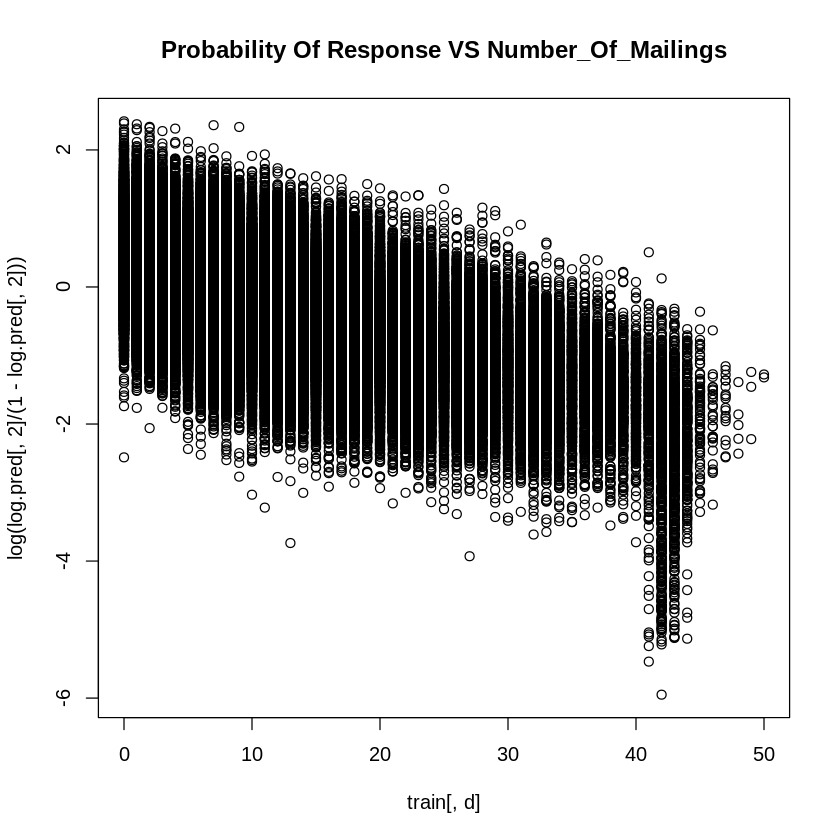

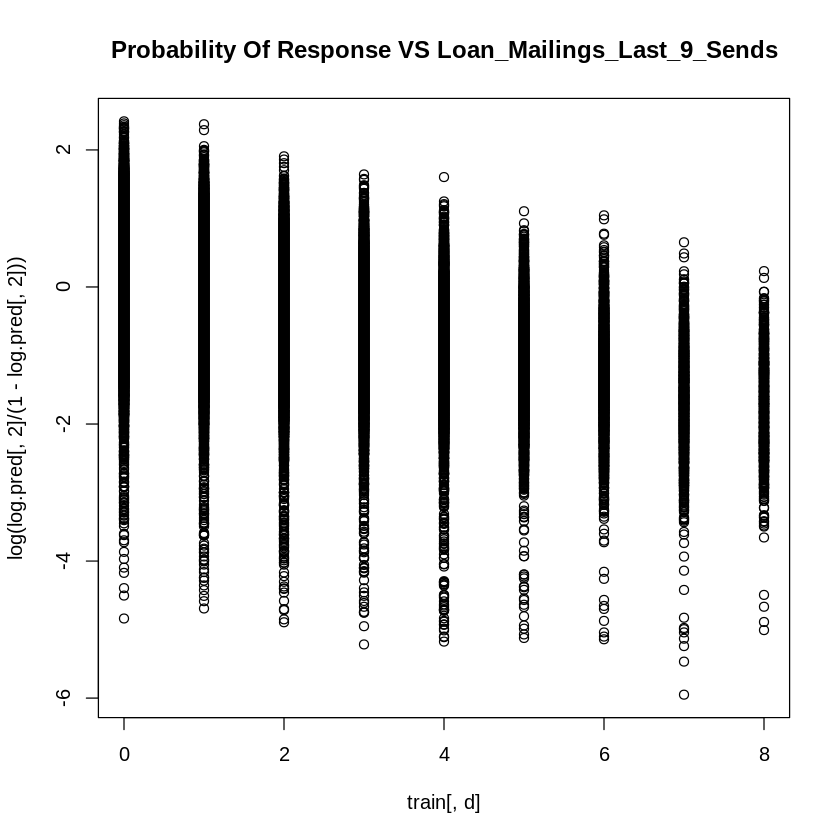

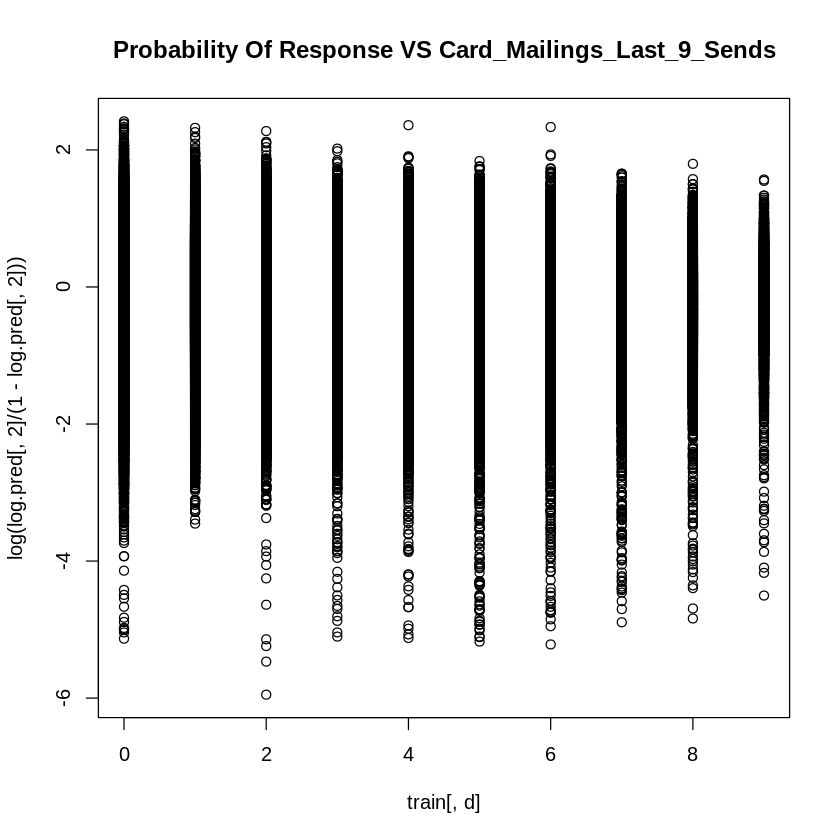

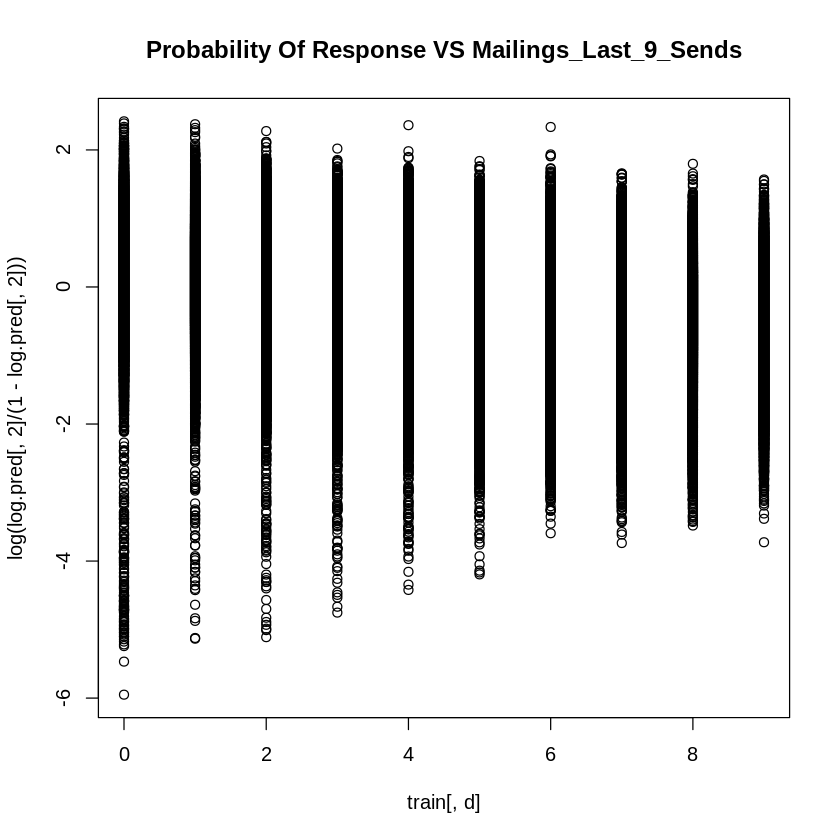

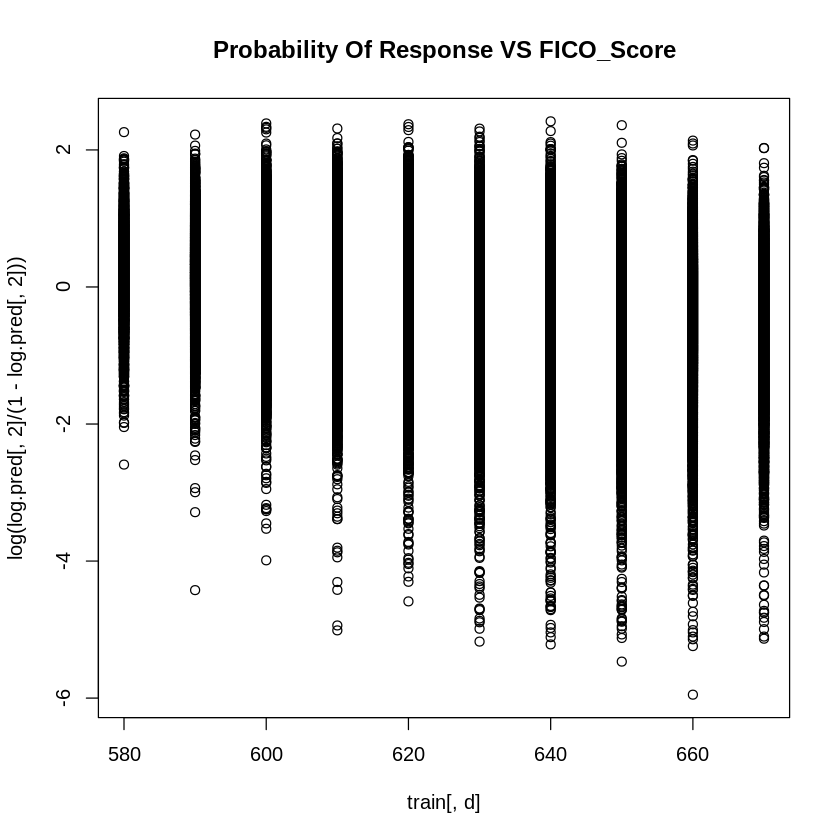

...

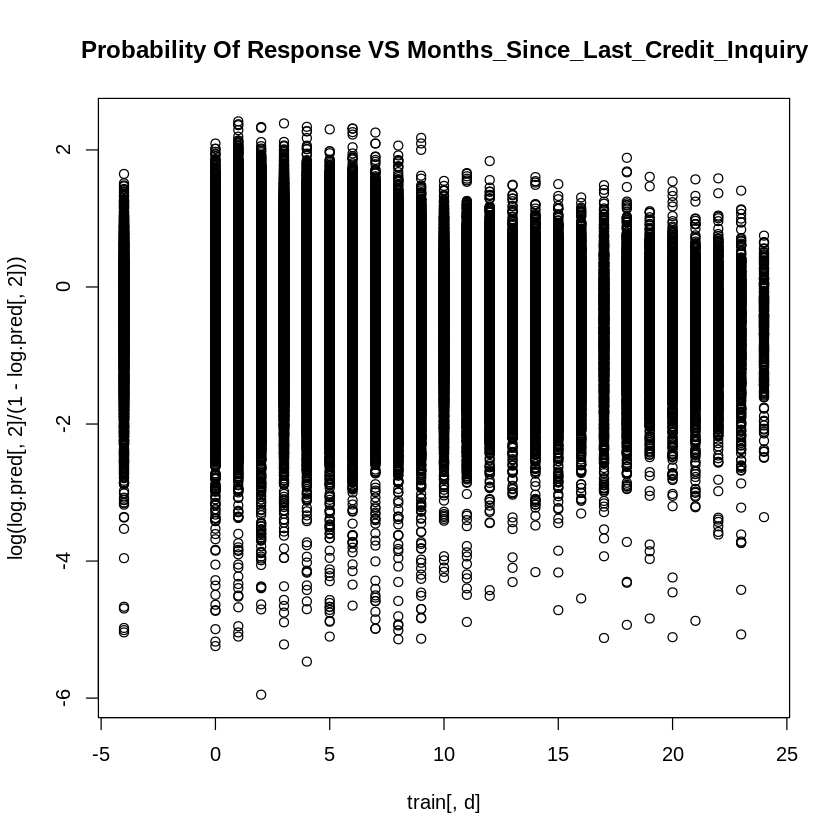

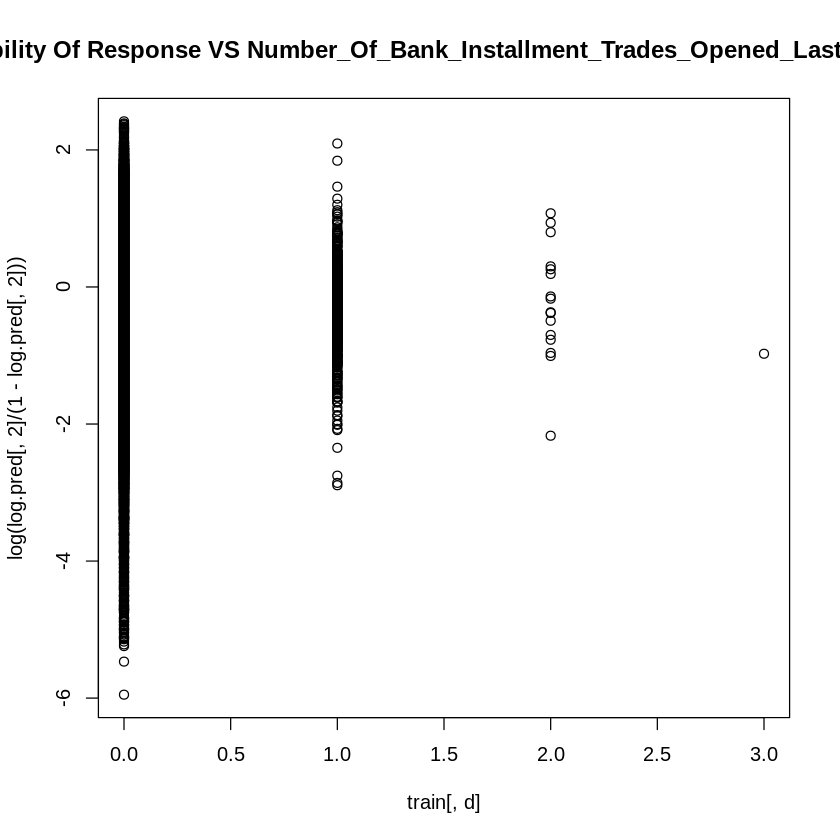

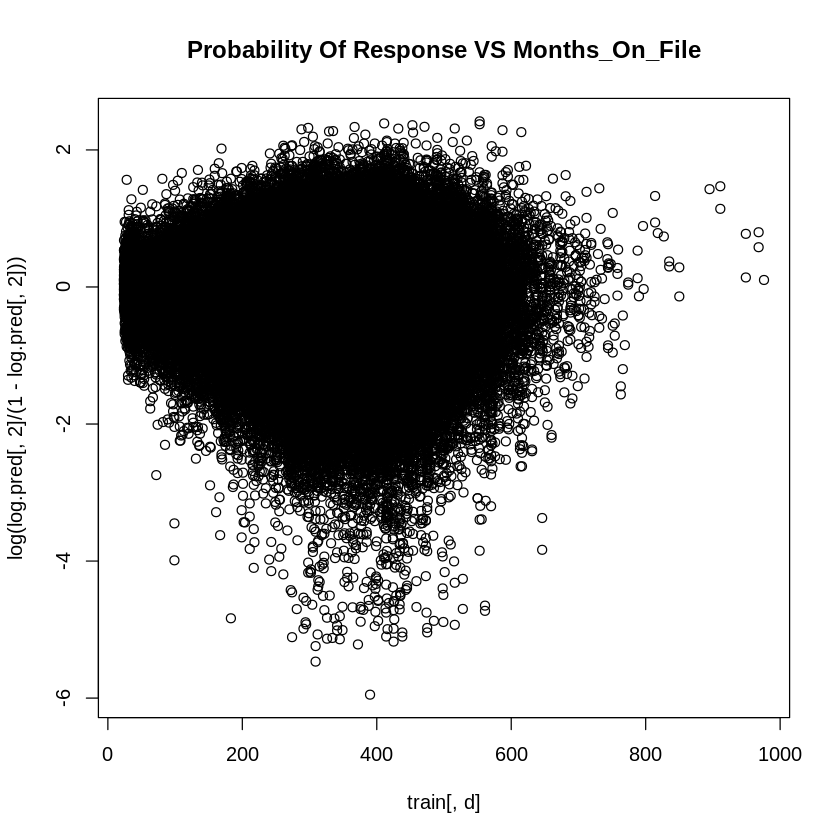

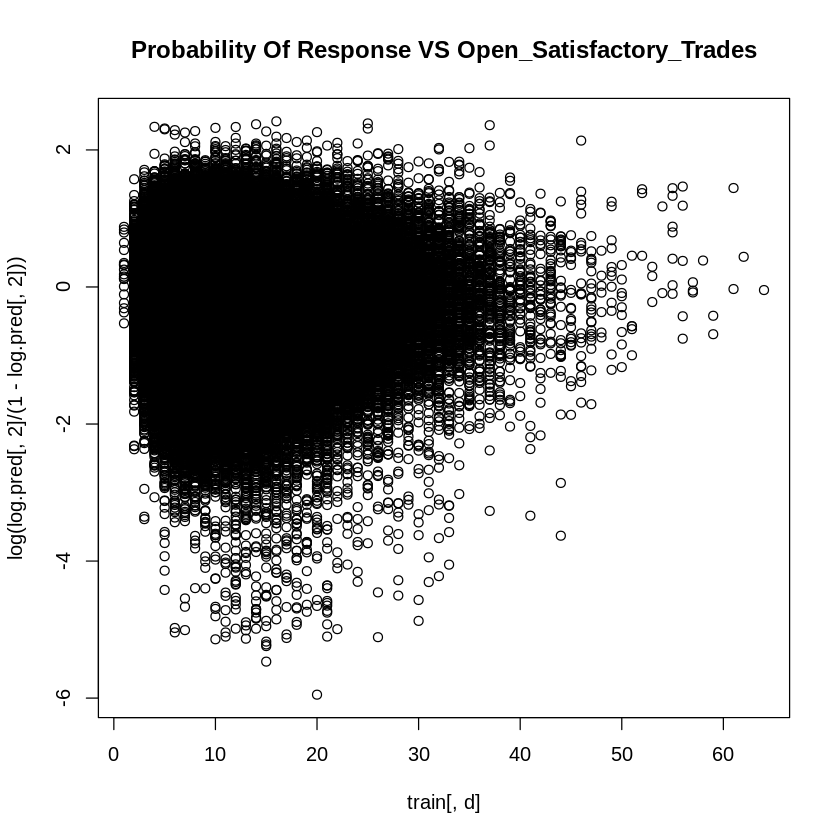

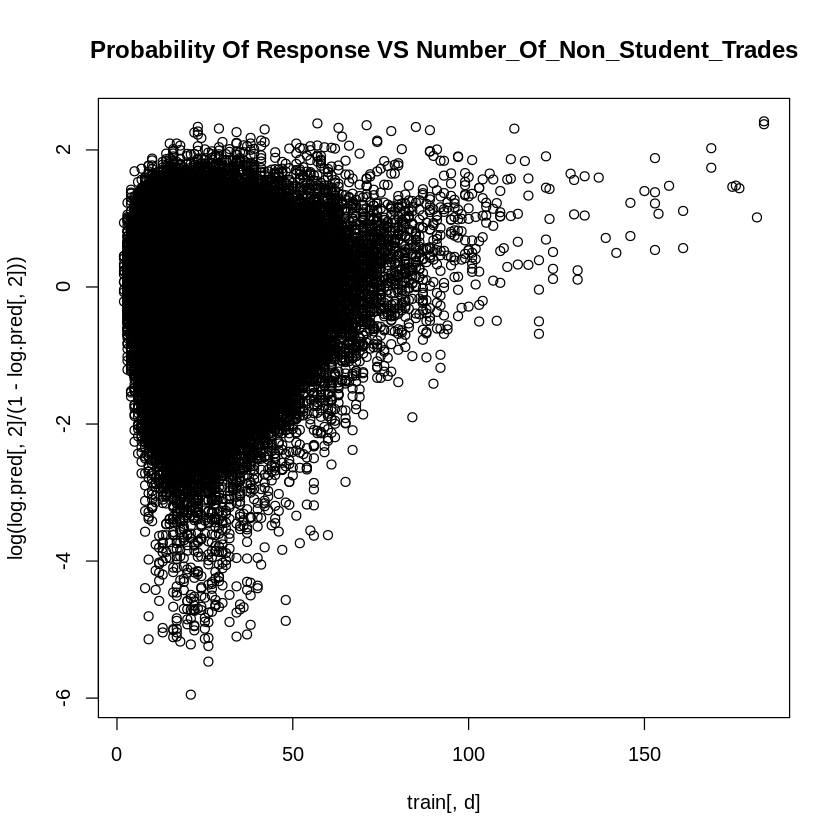

In [111]:
###check for multicollinearity
VIF(glm(Response ~ . , data = train[,names(train) %notin% c("Campaign_Year","Campaign_Month")],family = "binomial"))
###no variables with a VIF above 4, we are good to keep them
###check linearity assumptions
log.pred <- predict(log.model, type = "prob")
for (d in 1:NCOL(train)){
    if(is.numeric(train[,d]) == TRUE){
        plot(y = log(log.pred[,2]/(1-log.pred[,2])), x = train[,d], main = paste("Probability Of Response VS", names(train)[d]))
    }
}
### drop card and total last 9 sends mailing to reduce collinearity then re-run

In [112]:
###lets see what transformed variables look like 
VIF(glm(Response ~ . , data = train[,names(train) %notin% c("Campaign_Year","Campaign_Month","Mailings_Last_9_Sends")], family = "binomial", weights = model_weights))


Number_Of_Mailings 
                                              2.232715 
                            Loan_Mailings_Last_9_Sends 
                                              1.315588 
                            Card_Mailings_Last_9_Sends 
                                              1.922961 
                                            FICO_Score 
                                              1.410943 
                                   Loan_Response_Score 
                                              1.106939 
                                    Loan_Default_Score 
                                              1.507792 
                                          Income_Score 
                                              1.183832 
                                      Bankruptcy_Score 
                                              1.547185 
                                         Vantage_Score 
                                              1.342093 
                                  Months_Since_Last_CC 
                                              1.125696 
                      Months_Since_Last_Credit_Inquiry 
                                              1.062436 
Number_Of_Bank_Installment_Trades_Opened_Last_6_Months 
                                              1.001937 
                                        Months_On_File 
                                              1.127990 
                              Open_Satisfactory_Trades 
                                              1.357824 
                          Number_Of_Non_Student_Trades 
                                              1.479990

In [117]:
###let's remove some variables
train <- train[,names(train) %notin% c("Campaign_Year","Campaign_Month","Mailings_Last_9_Sends")]
#model again
log.model <- train(Response ~ . + Loan_Response_Score:Loan_Mailings_Last_9_Sends + Months_On_File:Number_Of_Non_Student_Trades, data = train,
                  method = "glm",trControl = trControl, metric = "Weighted Accuracy", 
#                    weights = model_weights,
                  family = binomial())
summary(log.model)
log.model

Setting levels: control = No, case = Yes

Setting direction: controls < cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting direction: controls > cases

Setting levels: control = No, case = Yes

Setting di


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.2389  -1.1004   0.1176   1.0857   2.1172  

Coefficients:
                                                         Estimate Std. Error
(Intercept)                                             1.555e+00  1.024e-01
Number_Of_Mailings                                     -4.527e-02  5.943e-04
Loan_Mailings_Last_9_Sends                             -6.997e-02  1.442e-02
Card_Mailings_Last_9_Sends                              2.284e-02  1.571e-03
FICO_Score                                             -1.085e-03  1.568e-04
Loan_Response_Score                                     8.562e+01  1.177e+00
Loan_Default_Score                                      9.855e+00  1.616e-01
Income_Score                                           -8.139e-05  2.952e-06
Bankruptcy_Score                                       -3.322e+00  2.869e-01
Vantage_Score                                          -4.765e-03  1.013e-04
Months_Since

Generalized Linear Model 

236512 samples
    15 predictor
     2 classes: 'No', 'Yes' 

No pre-processing
Resampling: Cross-Validated (10 fold, repeated 3 times) 
Summary of sample sizes: 212861, 212862, 212861, 212861, 212860, 212860, ... 
Addtional sampling using up-sampling

Resampling results:

  Weighted Accuracy  Accuracy   ROC        Sensitivity  Specificity
  0.6266108          0.6110458  0.6767926  0.610828     0.6423936  


In [114]:
###lets store the coefficients
coef1 <- summary(log.model)$coefficients[,c(1:2)]
coef1

,Estimate,Std. Error
(Intercept),1.631995e+00,9.920842e-02
Number_Of_Mailings,-4.449157e-02,5.926311e-04
Loan_Mailings_Last_9_Sends,-1.279067e-01,2.557489e-03
Card_Mailings_Last_9_Sends,2.340440e-02,1.566378e-03
FICO_Score,-1.290531e-03,1.563650e-04
Loan_Response_Score,8.386905e+01,9.246246e-01
Loan_Default_Score,9.913636e+00,1.616528e-01
Income_Score,-7.390688e-05,2.932832e-06
Bankruptcy_Score,-2.881037e+00,2.859391e-01
Vantage_Score,-4.669278e-03,1.011456e-04


In [17]:
#lets create a model on another month, using the same coefficients
dm <- dm.df[grep("^154_.*",dm.df$Creative_Code),]
names.list <- c("Creative_Code","Campaign_Year", "Campaign_Month","Number_Of_Mailings", 
"Loan_Mailings_Last_9_Sends","Card_Mailings_Last_9_Sends","Mailings_Last_9_Sends",
"FICO_Score", "Loan_Response_Score", "Loan_Default_Score", "Income_Score","Bankruptcy_Score","Vantage_Score","Months_Since_Last_CC","Months_Since_Last_Credit_Inquiry","Number_Of_Bank_Installment_Trades_Opened_Last_6_Months", "Months_On_File","Open_Satisfactory_Trades","Number_Of_Non_Student_Trades"
,"App_Year")
dm <- dm[,names(dm) %in% names.list]
dm$Response <- factor(ifelse(is.na(dm$App_Year),0,1), ordered = TRUE)
dm <- dm[,names(dm) %notin% c("App_Year","Creative_Code")]
###na's check
# sapply(train, function(x) sum(is.na(x)))
col_index <- sample(1:NROW(dm),NROW(dm)*.8)
train2 <- dm
###initial model
set.seed(1)
trControl <- caret::trainControl(method = 'repeatedcv', number = 10, repeats = 3, returnResamp = 'all')
log.model2 <- train(Response ~ Number_Of_Mailings + Loan_Response_Score + Loan_Mailings_Last_9_Sends + Loan_Default_Score+Income_Score+Vantage_Score+Months_Since_Last_CC+Months_Since_Last_Credit_Inquiry+Open_Satisfactory_Trades+Number_Of_Non_Student_Trades, data = train2,
                  method = "glm",trControl = trControl,
                  family = binomial())
summary(log.model2)


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-0.4552  -0.1234  -0.0996  -0.0760   3.9435  

Coefficients:
                                   Estimate Std. Error z value Pr(>|z|)    
(Intercept)                      -5.520e+00  8.422e-01  -6.554 5.59e-11 ***
Number_Of_Mailings               -7.407e-02  1.040e-02  -7.125 1.04e-12 ***
Loan_Response_Score               7.654e+01  9.336e+00   8.199 2.42e-16 ***
Loan_Mailings_Last_9_Sends       -1.679e-01  6.532e-02  -2.570 0.010166 *  
Loan_Default_Score                1.059e+01  1.836e+00   5.771 7.90e-09 ***
Income_Score                     -4.769e-05  3.751e-05  -1.272 0.203486    
Vantage_Score                    -1.717e-03  1.154e-03  -1.487 0.136951    
Months_Since_Last_CC             -1.061e-02  2.840e-03  -3.738 0.000186 ***
Months_Since_Last_Credit_Inquiry -1.908e-02  9.393e-03  -2.031 0.042216 *  
Open_Satisfactory_Trades         -7.627e-03  8.492e-03  -0.898 0.369150    
Number_Of_Non_Student_T

In [19]:
###check for outliers
log.model.data <- augment(glm(Response ~ Number_Of_Mailings + Loan_Response_Score + Loan_Mailings_Last_9_Sends + Loan_Default_Score+Income_Score+Vantage_Score+Months_Since_Last_CC+Months_Since_Last_Credit_Inquiry+Open_Satisfactory_Trades+Number_Of_Non_Student_Trades , data = train2, family = "binomial")) %>% mutate(Index = 1:n())
#log.model.data$Index[abs(log.model.data$.std.resid)>= 3]
#log.model.data$Index[log.model.data$.cooksd > qf(0.5,NCOL(train)-1,length(log.model.data$Index) - NCOL(train)-1)]
#log.model.data$Index[log.model.data$.cooksd > 4/NROW(train)]
index_remove <- log.model.data$Index[abs(log.model.data$.std.resid)>= 3 & log.model.data$.cooksd > 4/NROW(train) & log.model.data$Response != 1]
###remove outliers from training
log.model.data[index_remove,]
if(length(index_remove) > 0){
    train2 <- train2[-index_remove,]
    }

.rownames,Response,Number_Of_Mailings,Loan_Response_Score,Loan_Mailings_Last_9_Sends,Loan_Default_Score,Income_Score,Vantage_Score,Months_Since_Last_CC,Months_Since_Last_Credit_Inquiry,Open_Satisfactory_Trades,Number_Of_Non_Student_Trades,.fitted,.resid,.std.resid,.hat,.sigma,.cooksd,Index
<chr>,<ord>,<int>,<dbl>,<int>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>


In [18]:
###let's remove some variables
train2 <- train2[,names(train) %notin% c("Campaign_Year","Campaign_Month","Mailings_Last_9_Sends","Card_Mailings_Last_9_Sends","FICO_Score","Number_Of_Bank_Installment_Trades_Opened_Last_6_Months","Months_On_File","Bankruptcy_Score")]
#model again
log.model2 <- train(Response ~ Number_Of_Mailings  + Loan_Mailings_Last_9_Sends + Loan_Default_Score+Income_Score+Vantage_Score+Months_Since_Last_CC+Months_Since_Last_Credit_Inquiry*Loan_Response_Score+Open_Satisfactory_Trades+Number_Of_Non_Student_Trades, data = train2,
                  method = "glm",trControl = trControl,
                  family = binomial())
summary(log.model2)
###lets store the coefficients
coef2 <- summary(log.model2)$coefficients[,c(1:2)]
coef2


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-0.4916  -0.1226  -0.0995  -0.0762   3.8731  

Coefficients:
                                                         Estimate Std. Error
(Intercept)                                            -5.908e+00  8.545e-01
Number_Of_Mailings                                     -7.378e-02  1.039e-02
Loan_Mailings_Last_9_Sends                             -1.608e-01  6.531e-02
Loan_Default_Score                                      1.065e+01  1.837e+00
Income_Score                                           -4.696e-05  3.752e-05
Vantage_Score                                          -1.781e-03  1.155e-03
Months_Since_Last_CC                                   -1.066e-02  2.847e-03
Months_Since_Last_Credit_Inquiry                        9.701e-02  4.521e-02
Loan_Response_Score                                     1.003e+02  1.278e+01
Open_Satisfactory_Trades                               -8.175e-03  8.498e-03
Number_Of_No

,Estimate,Std. Error
(Intercept),-5.908016e+00,8.544754e-01
Number_Of_Mailings,-7.378472e-02,1.039359e-02
Loan_Mailings_Last_9_Sends,-1.608158e-01,6.530735e-02
Loan_Default_Score,1.064775e+01,1.837270e+00
Income_Score,-4.696035e-05,3.751964e-05
Vantage_Score,-1.780900e-03,1.154574e-03
Months_Since_Last_CC,-1.066446e-02,2.846562e-03
Months_Since_Last_Credit_Inquiry,9.701106e-02,4.520690e-02
Loan_Response_Score,1.003236e+02,1.278304e+01
Open_Satisfactory_Trades,-8.174538e-03,8.498087e-03


In [19]:
###lets combine dataframes and test for differences in coefs
coef.df <- as.data.frame(cbind(coef1,coef2))
colnames(coef.df) <- c("Baseline Coefficient","Baseline Error","New Coefficient","New Error")
coef.df

,Baseline Coefficient,Baseline Error,New Coefficient,New Error
,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-3.594884e+00,5.314120e-01,-5.908016e+00,8.544754e-01
Number_Of_Mailings,-3.911094e-02,3.602044e-03,-7.378472e-02,1.039359e-02
Loan_Mailings_Last_9_Sends,-1.509273e-01,2.078589e-02,-1.608158e-01,6.530735e-02
Loan_Default_Score,8.076282e+00,1.129300e+00,1.064775e+01,1.837270e+00
Income_Score,-8.628485e-05,2.357007e-05,-4.696035e-05,3.751964e-05
Vantage_Score,-5.215842e-03,7.039123e-04,-1.780900e-03,1.154574e-03
Months_Since_Last_CC,-4.836852e-03,1.956021e-03,-1.066446e-02,2.846562e-03
Months_Since_Last_Credit_Inquiry,6.489186e-02,3.752837e-02,9.701106e-02,4.520690e-02
Loan_Response_Score,1.000461e+02,9.095548e+00,1.003236e+02,1.278304e+01


In [20]:
###calculate t-stats and p-values
coef.df$Tstat <- (coef.df$`New Coefficient`- coef.df$`Baseline Coefficient`)/coef.df$`New Error`
coef.df$Pvalue <- pt(coef.df$Tstat, df = NROW(train2) - NROW(coef.df) - 1)
write.csv(coef.df,"Coefficients From Logistic Regression.csv", na = "")
coef.df

,Baseline Coefficient,Baseline Error,New Coefficient,New Error,Tstat,Pvalue
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-3.594884e+00,5.314120e-01,-5.908016e+00,8.544754e-01,-2.70707828,0.0033944168
Number_Of_Mailings,-3.911094e-02,3.602044e-03,-7.378472e-02,1.039359e-02,-3.33607195,0.0004249912
Loan_Mailings_Last_9_Sends,-1.509273e-01,2.078589e-02,-1.608158e-01,6.530735e-02,-0.15141449,0.4398245130
Loan_Default_Score,8.076282e+00,1.129300e+00,1.064775e+01,1.837270e+00,1.39961184,0.9191838487
Income_Score,-8.628485e-05,2.357007e-05,-4.696035e-05,3.751964e-05,1.04810463,0.8527036908
Vantage_Score,-5.215842e-03,7.039123e-04,-1.780900e-03,1.154574e-03,2.97507241,0.9985350969
Months_Since_Last_CC,-4.836852e-03,1.956021e-03,-1.066446e-02,2.846562e-03,-2.04724583,0.0203181176
Months_Since_Last_Credit_Inquiry,6.489186e-02,3.752837e-02,9.701106e-02,4.520690e-02,0.71049338,0.7613001589
Loan_Response_Score,1.000461e+02,9.095548e+00,1.003236e+02,1.278304e+01,0.02170957,0.5086601655


In [21]:
campaign_select <- c("^152.*", "^153.*", "^154.*")
dm <- dm.df[grep(paste(campaign_select,collapse="|"), 
                        dm.df$Creative_Code),]

In [22]:
chi_sq <- function(x,y, data){
    temp <- as.data.frame.matrix(table(data$Creative_Code,data[,names(data)==x]))
    temp$Total <- rowSums(temp)
    temp
    prop.test(temp[,names(temp)==y], temp[,NCOL(temp)], correct = TRUE)
}
prop.df <- data.frame(predictor_variable = character(),predictor_level = numeric(), p_value = numeric())
predictors <- c("Loan_Response_Score","Number_Of_Mailings")
for (p in predictors){
    levels.p <- unique(dm[,names(dm) == p])
    for (l in levels.p){
        prop.df[NROW(prop.df) + 1,1] <- p
        prop.df[NROW(prop.df),2] <- l
        prop.df[NROW(prop.df),3] <- chi_sq(p,l,dm)$p.value
        for (c in 1:length(chi_sq(p,l,dm)$estimate)){
            prop.df[NROW(prop.df),3+c] <- chi_sq(p,l,dm)$estimate[c]
            names(prop.df)[NCOL(prop.df)] <- paste("Proportion",c)
        }
    }
}
prop.df <- prop.df[prop.df$p_value <= 0.05, ]
write.csv(prop.df[order(prop.df$predictor_variable,prop.df$predictor_level),],"Prop Test.csv",row.names=FALSE, na = "")

Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names(temp) == y], temp[, NCOL(temp)], correct = TRUE):
“Chi-squared approximation may be incorrect”
Warning message in prop.test(temp[, names

In [7]:
###data prep for random forest
`%notin%` <- Negate(`%in%`)
dm <- dm.df[grepl("155_.*",dm.df$Creative_Code) == FALSE,]
names.list <- c("Creative_Code","Number_Of_Mailings", 
"Loan_Mailings_Last_9_Sends","Card_Mailings_Last_9_Sends","Mailings_Last_9_Sends",
"FICO_Score", "Loan_Response_Score", "Loan_Default_Score", "Income_Score","Bankruptcy_Score","Vantage_Score","Months_Since_Last_CC","Months_Since_Last_Credit_Inquiry","Number_Of_Bank_Installment_Trades_Opened_Last_6_Months", "Months_On_File","Open_Satisfactory_Trades","Number_Of_Non_Student_Trades"
,"App_Year")
dm <- dm[,names(dm) %in% names.list]
dm$Response <- factor(ifelse(is.na(dm$App_Year),"No","Yes"), ordered = TRUE)
dm <- dm[,names(dm) %notin% c("App_Year","Creative_Code")]
###na's check
# sapply(train, function(x) sum(is.na(x)))
set.seed(1)
col_index <- sample(1:NROW(dm),NROW(dm)*.8)
train <- dm[col_index,]
# train2 <- SMOTE(train[,names(train)%notin% c("Response")], train$Response, K = 5)$data
# names(train2)[NCOL(train2)] <- "Response"
test <- dm[-col_index,]

In [29]:
###initial model, only run when needed to re-train
# set.seed(1)
# trControl <- caret::trainControl(method = 'repeatedcv', number = 10, repeats = 1, classProbs = TRUE,returnResamp = 'all', savePredictions = "final",summaryFunction = prSummary)
# gridcontrol <- expand.grid(.mtry = c(3,4,5))
# rf.model <- train(Response ~ ., data = train,
#                   method = "rf",trControl = trControl,
#                   ntree = 100, tuneGrid = gridcontrol, metric = "AUC")
# summary(rf.model)
# saveRDS(rf.model,"RF_model.rds")

                Length Class      Mode     
call                 5 -none-     call     
type                 1 -none-     character
predicted       463797 factor     numeric  
err.rate           300 -none-     numeric  
confusion            6 -none-     numeric  
votes           927594 matrix     numeric  
oob.times       463797 -none-     numeric  
classes              2 -none-     character
importance          16 -none-     numeric  
importanceSD         0 -none-     NULL     
localImportance      0 -none-     NULL     
proximity            0 -none-     NULL     
ntree                1 -none-     numeric  
mtry                 1 -none-     numeric  
forest              14 -none-     list     
y               463797 ordered    numeric  
test                 0 -none-     NULL     
inbag                0 -none-     NULL     
xNames              16 -none-     character
problemType          1 -none-     character
tuneValue            1 data.frame list     
obsLevels            2 -none-   

In [8]:
###read in model
rf.model <- readRDS("RF_model.rds")
rf.model
varImp(rf.model)

Random Forest 

463797 samples
    16 predictor
     2 classes: 'No', 'Yes' 

No pre-processing
Resampling: Cross-Validated (10 fold, repeated 1 times) 
Summary of sample sizes: 417418, 417417, 417417, 417418, 417417, 417418, ... 
Resampling results across tuning parameters:

  mtry  AUC        Precision  Recall     F        
  3     0.4437994  0.9940982  1.0000000  0.9970403
  4     0.4467894  0.9941067  0.9999978  0.9970436
  5     0.4479968  0.9941153  1.0000000  0.9970490

AUC was used to select the optimal model using the largest value.
The final value used for the model was mtry = 5.

rf variable importance

                                                       Overall
Months_On_File                                          100.00
Vantage_Score                                            81.54
Income_Score                                             66.02
Number_Of_Non_Student_Trades                             65.06
Months_Since_Last_CC                                     53.51
Open_Satisfactory_Trades                                 52.06
Months_Since_Last_Credit_Inquiry                         44.47
Number_Of_Mailings                                       41.05
Loan_Response_Score                                      40.14
FICO_Score                                               39.80
Bankruptcy_Score                                         30.06
Loan_Default_Score                                       29.77
Mailings_Last_9_Sends                                    24.39
Card_Mailings_Last_9_Sends                               23.63
Loan_Mailings_Last_9_Sends     

In [9]:
###set thresholds
thresholds <- c(0.005,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9)
rf.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
rf.metrics[length(thresholds),] <- rep(NA, ncol(rf.metrics))
rf.pred <- predict(rf.model, newdata = train, type = "prob")
for (i in 1:length(thresholds)){
    rf.pred2 <- as.factor(ifelse(rf.pred$Yes >= thresholds[i],"Yes","No"))
    rf.confusion <- confusionMatrix(data = rf.pred2, train$Response)
    rf.metrics$Threshold[i] <- thresholds[i]
    rf.metrics$Accuracy[i] <- rf.confusion$overall['Accuracy']
    rf.metrics$Sensitivity[i] <- rf.confusion$byClass["Sensitivity"]
    rf.metrics$Specificity[i] <- rf.confusion$byClass["Specificity"]
    rf.metrics$Precision[i] <- rf.confusion$byClass["Precision"]
}
rf.metrics

,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.005,0.7223372,0.7208865,0.92263868,0.9992234
2,0.010,0.7223372,0.7208865,0.92263868,0.9992234
3,0.050,0.9910328,0.9921036,0.84317841,0.9988565
4,0.100,0.9980379,0.9992421,0.83178411,0.9987822
5,0.200,0.9987365,0.9999631,0.82938531,0.9987658
6,0.300,0.9987667,0.9999957,0.82908546,0.9987636
7,0.400,0.9987710,1.0000000,0.82908546,0.9987637
8,0.500,0.9987624,1.0000000,0.82788606,0.9987550
9,0.600,0.9978008,1.0000000,0.69415292,0.9977897


,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.4,0.9988098,1,0.8285714,0.9988029


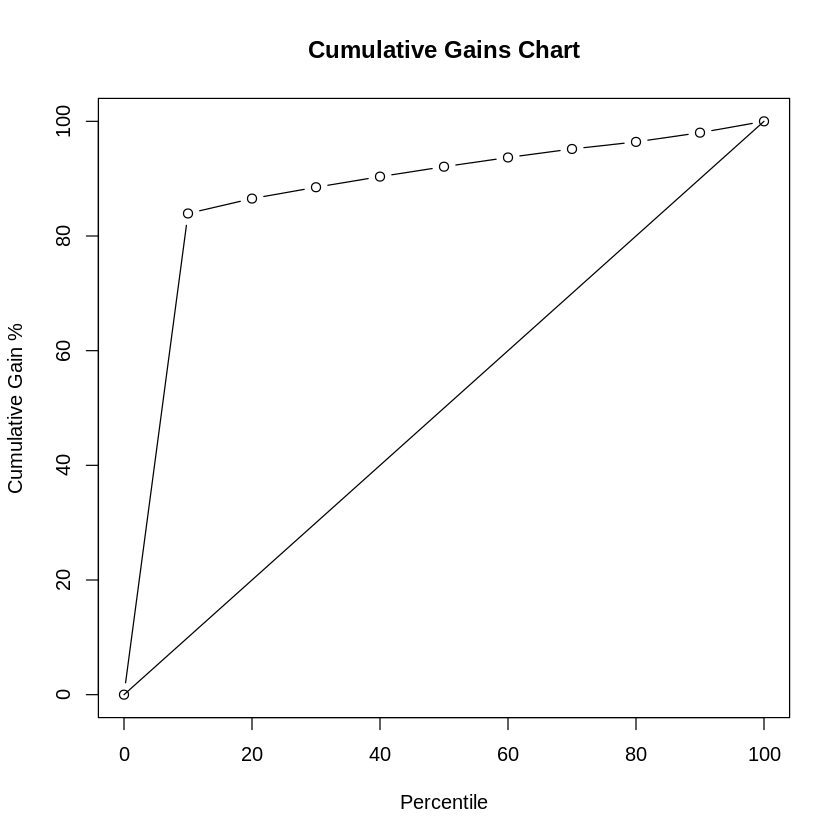

In [10]:
###run on test
thresholds <- 0.4
rf.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
rf.metrics[length(thresholds),] <- rep(NA, ncol(rf.metrics))
rf.pred <- predict(rf.model, newdata = test, type = "prob")
rf.pred <- as.factor(ifelse(rf.pred$Yes >= thresholds,"Yes","No"))
rf.confusion <- confusionMatrix(data = rf.pred, test$Response)
rf.metrics$Threshold <- thresholds
rf.metrics$Accuracy <- rf.confusion$overall['Accuracy']
rf.metrics$Sensitivity <- rf.confusion$byClass["Sensitivity"]
rf.metrics$Specificity <- rf.confusion$byClass["Specificity"]
rf.metrics$Precision <- rf.confusion$byClass["Precision"]
rf.metrics
cumGainsChart(rf.pred, test$Response, resolution = 1/10)

In [15]:
###SMOTE model, only run when needed to re-train
# set.seed(1)
# trControl <- caret::trainControl(method = 'repeatedcv', number = 10, repeats = 1, classProbs = TRUE,returnResamp = 'all', savePredictions = "final",summaryFunction = prSummary)
# gridcontrol <- expand.grid(.mtry = c(3,4,5))
# rf.model.smote <- train(Response ~ ., data = train2,
#                   method = "rf",trControl = trControl,
#                   ntree = 100, tuneGrid = gridcontrol, metric = "AUC")
# summary(rf.model.smote)
# saveRDS(rf.model.smote,"RF_model_SMOTE.rds")

                Length  Class      Mode     
call                  5 -none-     call     
type                  1 -none-     character
predicted        920199 factor     numeric  
err.rate            300 -none-     numeric  
confusion             6 -none-     numeric  
votes           1840398 matrix     numeric  
oob.times        920199 -none-     numeric  
classes               2 -none-     character
importance           16 -none-     numeric  
importanceSD          0 -none-     NULL     
localImportance       0 -none-     NULL     
proximity             0 -none-     NULL     
ntree                 1 -none-     numeric  
mtry                  1 -none-     numeric  
forest               14 -none-     list     
y                920199 factor     numeric  
test                  0 -none-     NULL     
inbag                 0 -none-     NULL     
xNames               16 -none-     character
problemType           1 -none-     character
tuneValue             1 data.frame list     
obsLevels 

In [23]:
###read in model
rf.model.smote <- readRDS("RF_model_SMOTE.rds")
rf.model.smote
varImp(rf.model.smote)

Random Forest 

920199 samples
    16 predictor
     2 classes: 'No', 'Yes' 

No pre-processing
Resampling: Cross-Validated (10 fold, repeated 1 times) 
Summary of sample sizes: 828180, 828179, 828179, 828179, 828179, 828179, ... 
Resampling results across tuning parameters:

  mtry  AUC        Precision  Recall     F        
  3     0.6133166  0.9942553  0.9999978  0.9971183
  4     0.5688688  0.9942703  0.9999978  0.9971258
  5     0.5427376  0.9942747  1.0000000  0.9971291

AUC was used to select the optimal model using the largest value.
The final value used for the model was mtry = 3.

rf variable importance

                                                       Overall
Bankruptcy_Score                                        100.00
Loan_Mailings_Last_9_Sends                               86.51
Loan_Default_Score                                       69.92
Loan_Response_Score                                      65.18
Mailings_Last_9_Sends                                    62.88
Card_Mailings_Last_9_Sends                               59.48
Number_Of_Mailings                                       32.29
FICO_Score                                               24.51
Months_Since_Last_Credit_Inquiry                         21.93
Months_Since_Last_CC                                     19.02
Open_Satisfactory_Trades                                 18.95
Months_On_File                                           16.78
Income_Score                                             15.52
Vantage_Score                                            13.12
Number_Of_Non_Student_Trades   

In [28]:
###set thresholds
thresholds <- c(0.005,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9)
rf.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
rf.metrics[length(thresholds),] <- rep(NA, ncol(rf.metrics))
rf.pred <- predict(rf.model.smote, newdata = train2, type = "prob")
for (i in 1:length(thresholds)){
    rf.pred2 <- factor(ifelse(rf.pred$Yes >= thresholds[i],"Yes","No"), ordered = TRUE)
    rf.confusion <- confusionMatrix(data = rf.pred2, factor(train2$Response, ordered = TRUE))
    rf.metrics$Threshold[i] <- thresholds[i]
    rf.metrics$Accuracy[i] <- rf.confusion$overall['Accuracy']
    rf.metrics$Sensitivity[i] <- rf.confusion$byClass["Sensitivity"]
    rf.metrics$Specificity[i] <- rf.confusion$byClass["Specificity"]
    rf.metrics$Precision[i] <- rf.confusion$byClass["Precision"]
}
rf.metrics


,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.005,0.7960824,0.5944945,0.9988141,0.9980204
2,0.010,0.7960824,0.5944945,0.9988141,0.9980204
3,0.050,0.9883783,0.9802772,0.9965253,0.9964878
4,0.100,0.9972222,0.9983192,0.9961191,0.9961494
5,0.200,0.9977264,0.9999349,0.9955054,0.9955504
6,0.300,0.9967257,0.9999891,0.9934438,0.9935229
7,0.400,0.9948310,1.0000000,0.9896327,0.9897964
8,0.500,0.9925291,1.0000000,0.9850159,0.9853191
9,0.600,0.9871598,1.0000000,0.9742468,0.9750314


,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.5,0.9940492,1,0.1716687,0.9940418


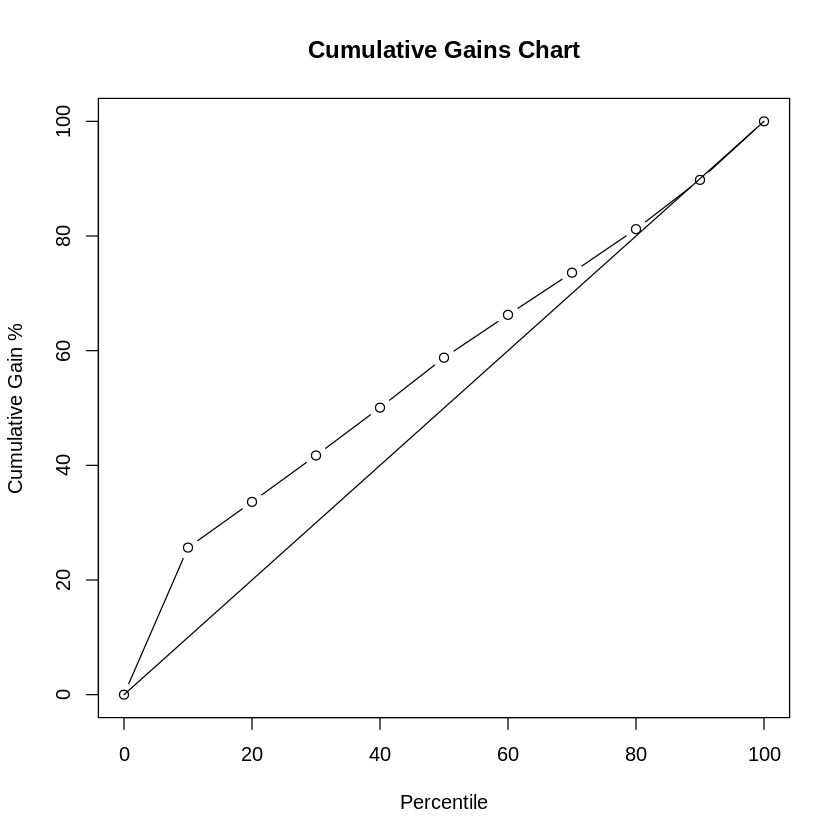

In [21]:
###run on test
thresholds <- 0.5
rf.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
rf.metrics[length(thresholds),] <- rep(NA, ncol(rf.metrics))
rf.pred <- predict(rf.model.smote, newdata = test, type = "prob")
rf.pred <- as.factor(ifelse(rf.pred$Yes >= thresholds,"Yes","No"))
rf.confusion <- confusionMatrix(data = rf.pred, test$Response)
rf.metrics$Threshold <- thresholds
rf.metrics$Accuracy <- rf.confusion$overall['Accuracy']
rf.metrics$Sensitivity <- rf.confusion$byClass["Sensitivity"]
rf.metrics$Specificity <- rf.confusion$byClass["Specificity"]
rf.metrics$Precision <- rf.confusion$byClass["Precision"]
rf.metrics
cumGainsChart(rf.pred, test$Response, resolution = 1/10)

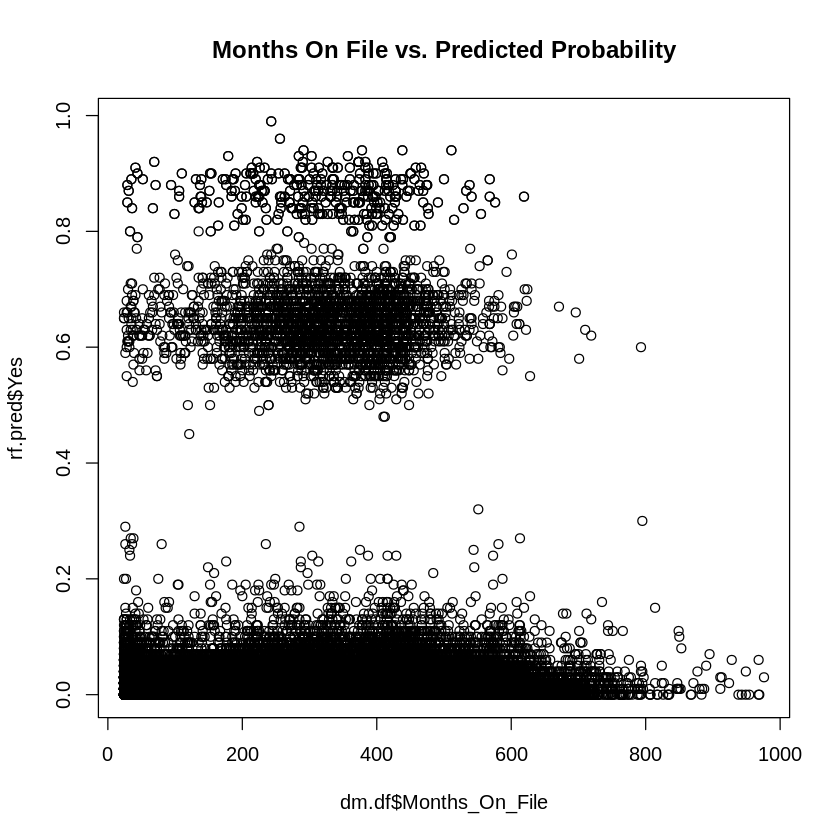

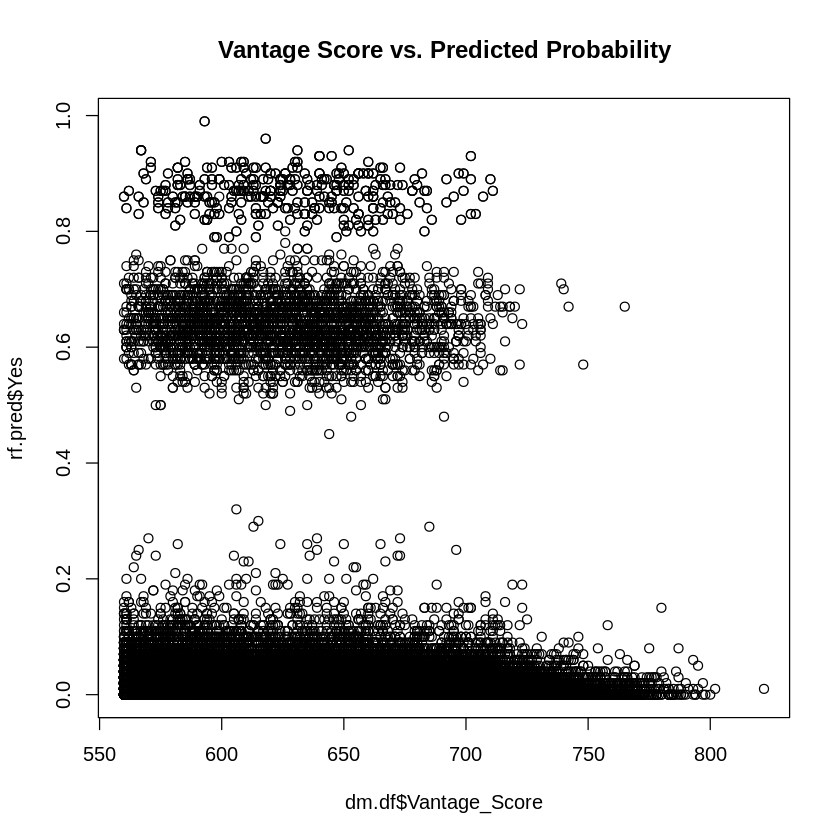

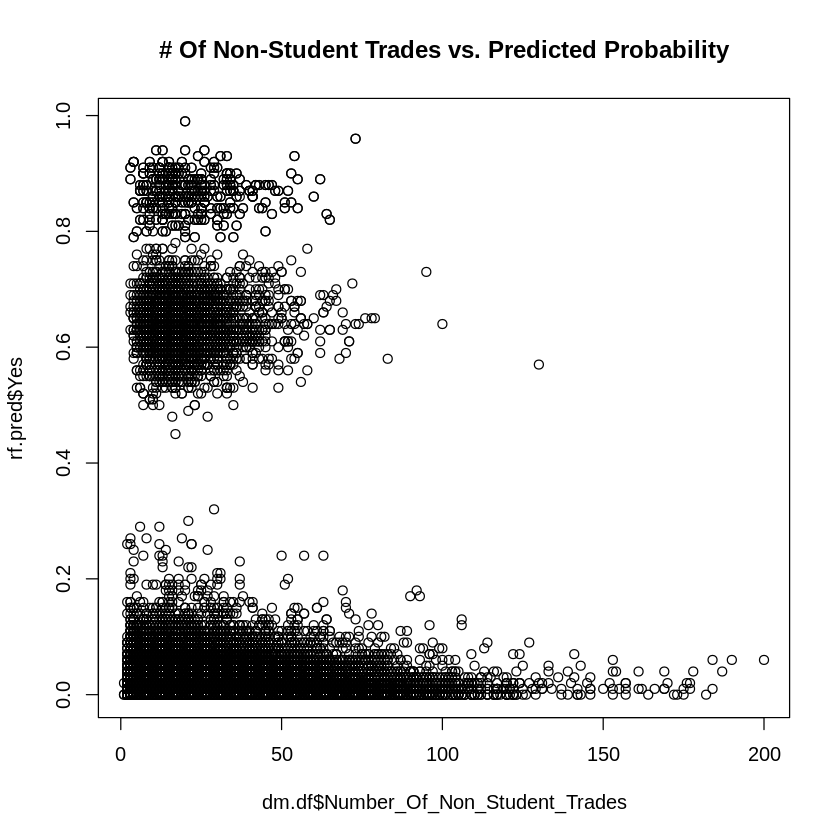

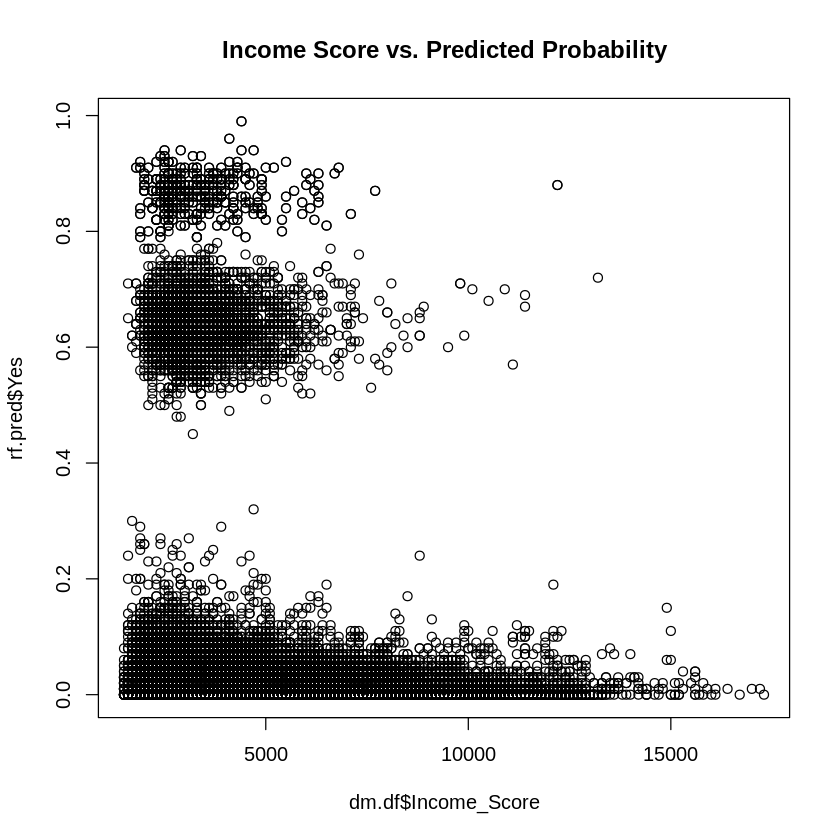

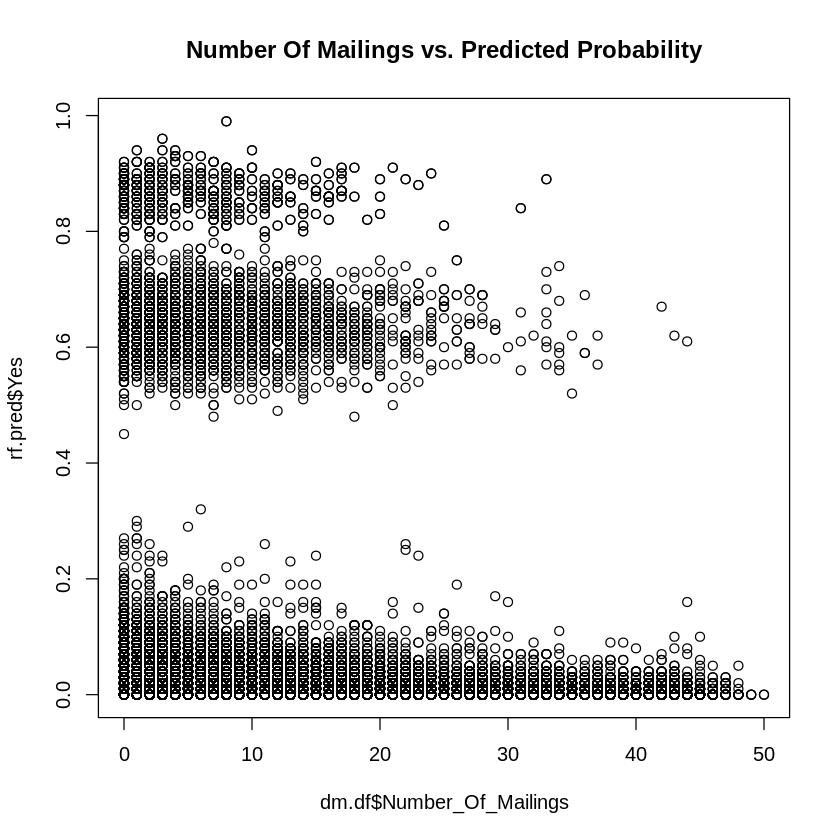

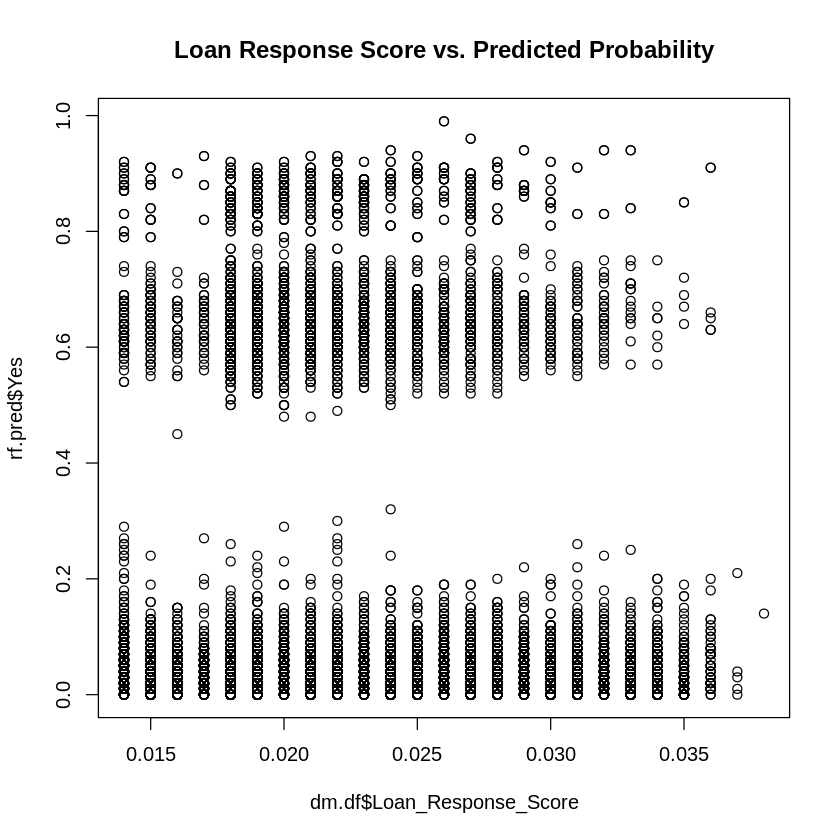

In [32]:
###Score entire dataset
thresholds <- 0.4
dm.df$Response <- factor(ifelse(is.na(dm.df$App_Year),"No","Yes"), ordered = TRUE)
rf.pred <- predict(rf.model, newdata = dm.df, type = "prob")
###plot 5 top variables against predicted probability
plot(x=dm.df$Months_On_File, y = rf.pred$Yes, main = "Months On File vs. Predicted Probability")
plot(x=dm.df$Vantage_Score, y = rf.pred$Yes, main = "Vantage Score vs. Predicted Probability")
plot(x=dm.df$Number_Of_Non_Student_Trades, y = rf.pred$Yes, main = "# Of Non-Student Trades vs. Predicted Probability")
plot(x=dm.df$Income_Score, y = rf.pred$Yes, main = "Income Score vs. Predicted Probability")
plot(x=dm.df$Number_Of_Mailings, y = rf.pred$Yes, main = "Number Of Mailings vs. Predicted Probability")
plot(x=dm.df$Loan_Response_Score, y = rf.pred$Yes, main = "Loan Response Score vs. Predicted Probability")
rf.pred <- as.factor(ifelse(rf.pred$Yes >= thresholds,"Yes","No"))
###Combine prediction to original
dm.df <- cbind(dm.df,rf.pred)
names(dm.df)[NCOL(dm.df)] <- "Predicted Response"


In [33]:
###compare actual to predicted
dm1 <- as.data.frame(aggregate(dm.df$Creative_Code, by = list(dm.df$Creative_Code), FUN = function(x){count = NROW(x)}))
names(dm1) <- c("Campaign","Sends")
dm2 <- as.data.frame(aggregate(dm.df$Creative_Code[!is.na(dm.df$App_Year)], by = list(dm.df$Creative_Code[!is.na(dm.df$App_Year)]), FUN = function(x){count = NROW(x)}))
names(dm2) <- c("Campaign","Responses")
dm3 <- as.data.frame(aggregate(dm.df$Loan_Issued, by = list(dm.df$Creative_Code), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm3) <- c("Campaign","Issuances")
dm4 <- as.data.frame(aggregate(dm.df$Total_Issuance, by = list(dm.df$Creative_Code), FUN = function(x){count = sum(x,na.rm = TRUE)}))
names(dm4) <- c("Campaign","Issuance Amount")
dm5 <- as.data.frame(aggregate(dm.df$Creative_Code[dm.df$`Predicted Response` == "Yes"], by = list(dm.df$Creative_Code[dm.df$`Predicted Response` == "Yes"]), FUN = function(x){count = NROW(x)}))
names(dm5) <- c("Campaign","Predicted Responses")
dm1 <- merge(dm1, dm2, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm3, by = "Campaign",all.x = TRUE)
dm1 <- merge(dm1, dm4, by = "Campaign",all.x = TRUE)
dm1$`Total Mailing Cost` <- dm1$Sends * 0.4
dm1$`Reporting Cost` <- dm1$Responses * 4
dm1$CPF <- (dm1$`Total Mailing Cost` + dm1$`Reporting Cost`) / dm1$`Issuance Amount`
dm1$GRR <- dm1$Responses/dm1$Sends
dm1$NRR <- dm1$Issuances/dm1$Sends
dm1 <- merge(dm1, dm5, by = "Campaign",all.x = TRUE)
dm1$`Predicted Issuances` <- round((sum(dm1$Issuances[1:NROW(dm1)-1])/sum(dm1$Responses[1:NROW(dm1)-1]))*dm1$`Predicted Responses`, digits = 0)
dm1$`Predicted Issuance Amount` <- round((sum(dm1$`Issuance Amount`[1:NROW(dm1)-1])/sum(dm1$Issuances[1:NROW(dm1)-1]))*dm1$`Predicted Issuances`, digits = 2)
dm1$`Predicted CPF` <- (dm1$`Total Mailing Cost` + dm1$`Reporting Cost`) / dm1$`Predicted Issuance Amount`
dm1$`Predicted GRR` <- dm1$`Predicted Responses`/dm1$Sends
dm1$`Predicted NRR` <- dm1$`Predicted Issuances`/dm1$Sends
dm1

Campaign,Sends,Responses,Issuances,Issuance Amount,Total Mailing Cost,Reporting Cost,CPF,GRR,NRR,Predicted Responses,Predicted Issuances,Predicted Issuance Amount,Predicted CPF,Predicted GRR,Predicted NRR
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
149_60_185,59409,375,18,129400,23763.6,1500,0.1952365,6.312175e-03,0.0003029844,308,16,112050.9,0.2254654,0.005184400,0.0002693195
150_60_191,58547,377,22,159100,23418.8,1508,0.1566738,6.439271e-03,0.0003757665,326,17,119054.1,0.2093737,0.005568176,0.0002903650
151_60_191,110807,879,53,356800,44322.8,3516,0.1340774,7.932712e-03,0.0004783091,733,39,273124.1,0.1751541,0.006615106,0.0003519633
152_60_226,132849,1085,62,438900,53139.6,4340,0.1309629,8.167167e-03,0.0004666953,922,49,343155.9,0.1675029,0.006940210,0.0003688398
153_60_247,103860,749,42,314800,41544.0,2996,0.1414867,7.211631e-03,0.0004043905,625,33,231105.0,0.1927262,0.006017716,0.0003177354
154_193_273,114278,668,23,141700,45711.2,2672,0.3414481,5.845395e-03,0.0002012636,518,28,196089.1,0.2467409,0.004532806,0.0002450165
155_193_273,119951,1,0,0,47980.4,4,Inf,8.336738e-06,0.0000000000,NA,NA,NA,NA,NA,NA


In [4]:
###let's try to generate a classification tree model to generate our ruleset
set.seed(1)
###create objective function
cust <- function(data, lev = NULL, model = NULL){
    require(pROC)
    if(!all(levels(data[,"pred"]) == levels(data[,"obs"])))
        stop("levels of observed and predicted data do not match")
    rocObject <- try(pROC::roc(data$obs, data[,lev[1]]), silent = TRUE)
    rocAUC <- if(class(rocObject)[1] == "try-error")
        NA
    else rocObject$auc
    accuracy <- NROW(data[data$pred == data$obs,])/NROW(data)
    wa <- 0.5*(NROW(data[data$pred == data$obs & data$obs == "Yes",])/NROW(data[data$obs == "Yes",])) + 0.5*(NROW(data[data$pred == data$obs & data$obs == "No",])/NROW(data[data$obs == "No",]))
    out <- c(wa, accuracy, rocAUC, sensitivity(data[,"pred"], data[,"obs"], lev[1]),specificity(data[,"pred"], data[,"obs"], lev[2]))
    names(out) <- c("Weighted Accuracy","Accuracy","ROC","Sensitivity","Specificity")
    out
}
set.seed(1)
# trControl <- caret::trainControl(method = 'repeatedcv', number = 10, repeats = 1, classProbs = TRUE,returnResamp = 'all', savePredictions = "final",summaryFunction = cust)
# tree.model <- train(Response ~ ., data = train,
#                   method = "rpart",trControl = trControl,
#                   metric = "Weighted Accuracy")
# summary(tree.model)
# saveRDS(tree.model,"tree_model.rds")
trControl <- caret::trainControl(method = 'repeatedcv', number = 10, repeats = 1, classProbs = TRUE,returnResamp = 'all', savePredictions = "final",summaryFunction = prSummary)
tree.model <- train(Response ~ ., data = train2,
                  method = "rpart",trControl = trControl,
                  metric = "AUC")
summary(tree.model)
saveRDS(tree.model,"tree_model_smote.rds")

CART 

463800 samples
    16 predictor
     2 classes: 'No', 'Yes' 

No pre-processing
Resampling: Cross-Validated (10 fold, repeated 3 times) 
Summary of sample sizes: 417421, 417420, 417420, 417420, 417420, 417421, ... 
Resampling results across tuning parameters:

  cp            Weighted Accuracy  Accuracy   ROC        Sensitivity
  3.568306e-05  0.5009029          0.9927914  0.5736537  0.9998856  
  4.332943e-05  0.5007621          0.9928108  0.5456193  0.9999073  
  5.514655e-05  0.5005689          0.9928259  0.5289053  0.9999254  
  Specificity
  0.001920113
  0.001616776
  0.001212428

Weighted Accuracy was used to select the optimal model using the largest value.
The final value used for the model was cp = 3.568306e-05.

Warning message:
“labs do not fit even at cex 0.15, there may be some overplotting”


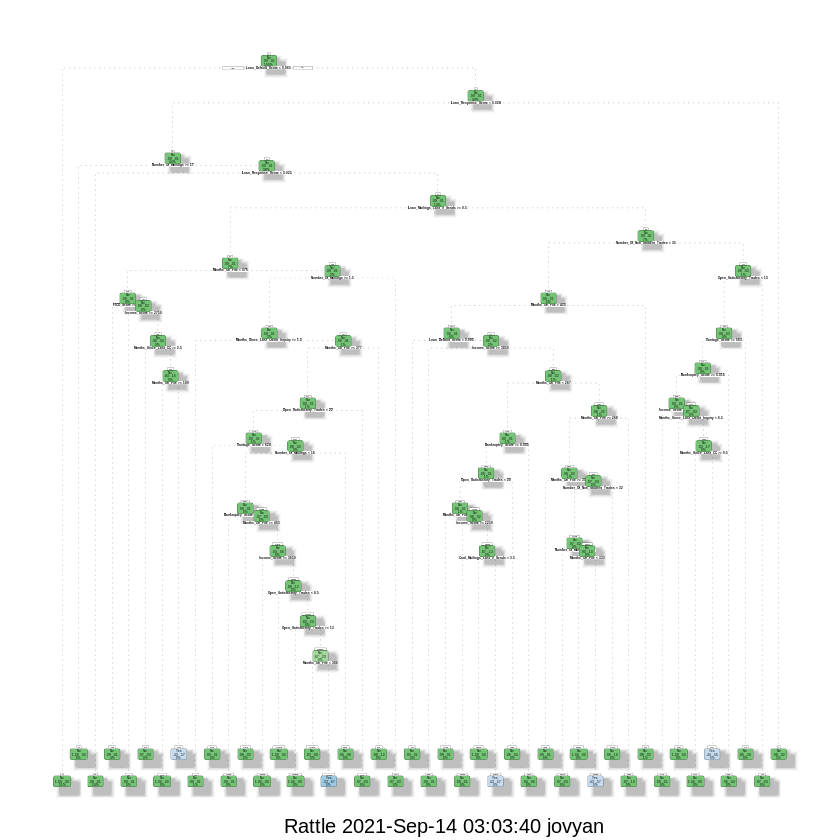

In [36]:
###read in model
# tree.model <- readRDS("tree_model.rds")
tree.model
fancyRpartPlot(tree.model$finalModel)

In [37]:
###set thresholds
thresholds <- c(0.005,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9)
tree.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
tree.metrics[length(thresholds),] <- rep(NA, ncol(tree.metrics))
tree.pred <- predict(tree.model, newdata = train, type = "prob")
for (i in 1:length(thresholds)){
    tree.pred2 <- factor(ifelse(tree.pred$Yes >= thresholds[i],"Yes","No"), ordered = TRUE)
    tree.confusion <- confusionMatrix(data = tree.pred2, factor(train$Response, ordered = TRUE))
    tree.metrics$Threshold[i] <- thresholds[i]
    tree.metrics$Accuracy[i] <- tree.confusion$overall['Accuracy']
    tree.metrics$Sensitivity[i] <- tree.confusion$byClass["Sensitivity"]
    tree.metrics$Specificity[i] <- tree.confusion$byClass["Specificity"]
    tree.metrics$Precision[i] <- tree.confusion$byClass["Precision"]
}
tree.metrics

Warning message in confusionMatrix.default(data = tree.pred2, factor(train$Response, :
“Levels are not in the same order for reference and data. Refactoring data to match.”
Warning message in confusionMatrix.default(data = tree.pred2, factor(train$Response, :
“Levels are not in the same order for reference and data. Refactoring data to match.”
Warning message in confusionMatrix.default(data = tree.pred2, factor(train$Response, :
“Levels are not in the same order for reference and data. Refactoring data to match.”


,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.005,0.5720612,0.5717509,0.615407947,0.9952072
2,0.010,0.8807460,0.8850626,0.277828329,0.9941920
3,0.050,0.9924235,0.9994289,0.013952078,0.9929858
4,0.100,0.9928137,0.9998545,0.009402487,0.9929567
5,0.200,0.9928935,0.9999479,0.007582651,0.9929445
6,0.300,0.9929064,0.9999653,0.006976039,0.9929403
7,0.400,0.9929064,0.9999653,0.006976039,0.9929403
8,0.500,0.9929064,0.9999653,0.006976039,0.9929403
9,0.600,0.9928978,0.9999935,0.001819836,0.9929041


,Threshold,Accuracy,Sensitivity,Specificity,Precision
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.1,0.9925658,0.9997568,0.002392344,0.9928054


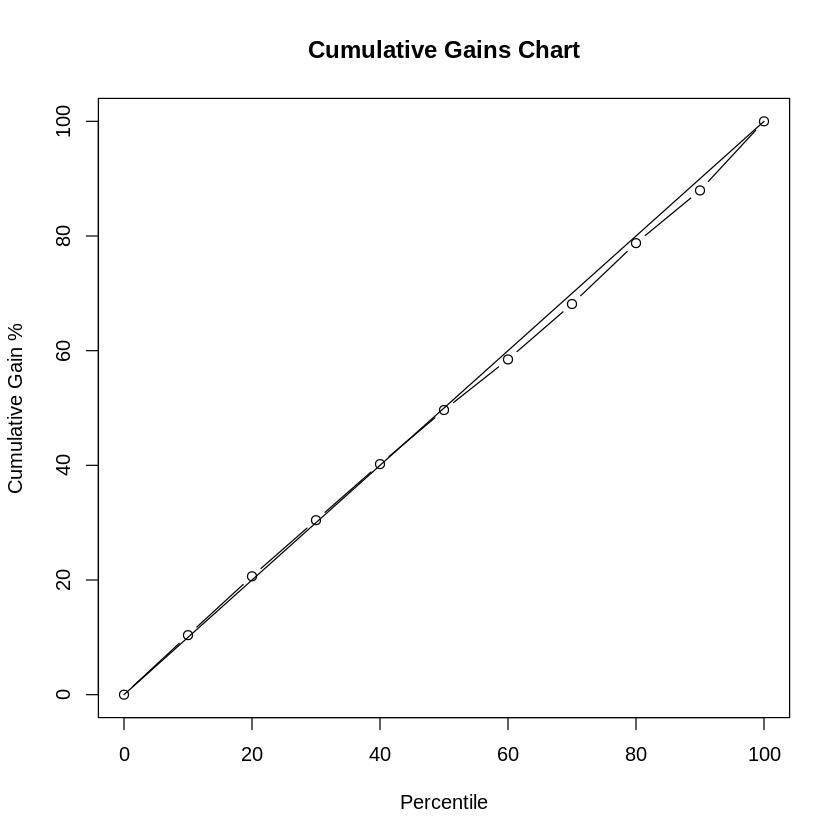

In [40]:
###run on test
thresholds <- 0.1
tree.metrics <- data.frame(Threshold = numeric(), Accuracy = numeric(), Sensitivity = numeric(), Specificity = numeric(), Precision = numeric())
tree.metrics[length(thresholds),] <- rep(NA, ncol(tree.metrics))
tree.pred <- predict(tree.model, newdata = test, type = "prob")
tree.pred <- as.factor(ifelse(tree.pred$Yes >= thresholds,"Yes","No"))
tree.confusion <- confusionMatrix(data = tree.pred, test$Response)
tree.metrics$Threshold <- thresholds
tree.metrics$Accuracy <- tree.confusion$overall['Accuracy']
tree.metrics$Sensitivity <- tree.confusion$byClass["Sensitivity"]
tree.metrics$Specificity <- tree.confusion$byClass["Specificity"]
tree.metrics$Precision <- tree.confusion$byClass["Precision"]
tree.metrics
cumGainsChart(tree.pred, test$Response, resolution = 1/10)

In [11]:
select.df <-Rdatalakeclient::run_query_with_lake("SELECT COALESCE(LENGTH(regexp_replace(dme.timesmailed, '[a-zA-Z0-9]', '')) + 1,0) AS Number_Of_Mailings, 
dme.times_mailed_loan_last_9_sends AS Loan_Mailings_Last_9_Sends,dme.times_mailed_card_last_9_sends AS Card_Mailings_Last_9_Sends,dme.times_mailed_last_9_sends AS Mailings_Last_9_Sends,
TRUNC(dme.fico_score,-1) AS FICO_Score, TRUNC(dme.pl_response_400_score,3) AS Loan_Response_Score, TRUNC(dme.pl_default_520_score,2) AS Loan_Default_Score, TRUNC(dme.bankruptcy_200_score,2) AS Bankruptcy_Score,TRUNC(dme.income_300_score,-2) AS Income_Score,dme.cvtg03 AS Vantage_Score,dme.bc21s AS Months_Since_Last_CC,dme.g102s AS Months_Since_Last_Credit_Inquiry,dme.bi05 AS Number_Of_Bank_Installment_Trades_Opened_Last_6_Months,COALESCE(dme.g106s,0) AS Months_On_File,COALESCE(dme.at03s,0) AS Open_Satisfactory_Trades,COALESCE(dme.at01 - COALESCE(dme.st01s,0),0) AS Number_Of_Non_Student_Trades
FROM avant.prod.dw.dw_orig.direct_mail_prospect_campaign as dme
WHERE dme.state not in ('IA', 'WV', 'CO', 'NY', 'VT','ME') and 
dme.state not in ('HI', 'NV') and
((dme.openbkc is null) OR (dme.openbkc = 0)) and
COALESCE(dme.lien3, 0) <= 1500 and
COALESCE(dme.judg3, 0) <= 1500 and
COALESCE(dme.pubcp01, 0) <= 1500 and
COALESCE(dme.attr03, 0) <= 1 and 
COALESCE(dme.attr01, 0) <= 60000 and
COALESCE(dme.g094s, 0) <= 2 and 
dme.bankruptcy_200_score <= 0.11111 and 
dme.pl_default_520_score <= 0.18 and 
dme.state != 'MA' and 
COALESCE(dme.fico_score, 0) >= 580 and
COALESCE(fico_score, 0) < 680 and  
COALESCE(cvtg03, 0) >= 560 and  
COALESCE(attr01, 0) >= 2000 and  
COALESCE(attr01, 0) <= 30000 and    
COALESCE(g106s, 0) >= 24 and  
COALESCE(s114s, 0) <= 3 and  
COALESCE(in21s, -1) not in (0,1,2) and 
COALESCE(at21s, 37) <= 36 and 
dme.income_300_score >= 1500 and 
--dme.pl_short_term_100_score <= 0.02125 and 
dme.pl_default_520_score <= 0.11 and (
(dme.pl_response_400_score >= 0.014  and dme.times_mailed_loan_last_9_sends <= 2 and dme.times_mailed_card_last_9_sends <= 6)
or ((dme.pl_response_400_score >= 0.0198  and dme.times_mailed_loan_last_9_sends <= 2) or (dme.pl_response_400_score >= 0.0198  and dme.times_mailed_loan_last_9_sends <= 4 and dme.times_mailed_card_last_9_sends <= 4))
or ((dme.pl_response_400_score >= 0.0255  and dme.times_mailed_loan_last_9_sends <= 2) or (dme.pl_response_400_score >= 0.0255  and dme.times_mailed_loan_last_9_sends <= 4 and dme.times_mailed_card_last_9_sends <= 6) or (dme.pl_response_400_score >= 0.0255  and dme.times_mailed_loan_last_9_sends <= 6 and dme.times_mailed_card_last_9_sends <= 4) or (dme.pl_response_400_score >= 0.0255  and dme.times_mailed_loan_last_9_sends <= 8 and dme.times_mailed_card_last_9_sends <= 0))
or (dme.pl_response_400_score >= 0.0312  and dme.times_mailed_loan_last_9_sends <= 6)
)", engine = 'dremio')

connecting to Avant's data lake with Dremio

running query using Dremio



In [25]:
thresholds <- 0.4
select.pred <- predict(rf.model.smote, newdata = select.df, type = "prob")
select.pred <- as.factor(ifelse(select.pred$Yes >= thresholds,"Yes","No"))
summary(select.pred)

       No              Yes         
 Min.   :0.3100   Min.   :0.00000  
 1st Qu.:0.9600   1st Qu.:0.00000  
 Median :0.9900   Median :0.01000  
 Mean   :0.9282   Mean   :0.07176  
 3rd Qu.:1.0000   3rd Qu.:0.04000  
 Max.   :1.0000   Max.   :0.69000  

In [27]:
NROW(select.pred$Yes[select.pred$Yes > 0.5])

[1] 3522

In [28]:
3522/315000

[1] 0.01118095

In [10]:
summary(temp2)

 Number_Of_Mailings Loan_Mailings_Last_9_Sends Card_Mailings_Last_9_Sends
 Min.   : 0.000     Min.   :0.0000             Min.   :0.000             
 1st Qu.: 1.750     1st Qu.:0.0000             1st Qu.:0.000             
 Median : 5.000     Median :0.0000             Median :2.000             
 Mean   : 6.353     Mean   :0.8162             Mean   :2.125             
 3rd Qu.: 9.000     3rd Qu.:1.0000             3rd Qu.:3.000             
 Max.   :38.000     Max.   :8.0000             Max.   :9.000             
 Mailings_Last_9_Sends   FICO_Score    Loan_Response_Score Loan_Default_Score
 Min.   :0.000         Min.   :580.0   Min.   :0.01400     Min.   :0.01000   
 1st Qu.:1.000         1st Qu.:610.0   1st Qu.:0.01900     1st Qu.:0.06000   
 Median :2.000         Median :630.0   Median :0.02100     Median :0.08000   
 Mean   :2.941         Mean   :629.8   Mean   :0.02222     Mean   :0.07228   
 3rd Qu.:4.250         3rd Qu.:650.0   3rd Qu.:0.02500     3rd Qu.:0.09000   
 Max.   :9.000

In [11]:
summary(temp)

 Number_Of_Mailings Loan_Mailings_Last_9_Sends Card_Mailings_Last_9_Sends
 Min.   : 0.000     Min.   :0.000              Min.   :0.000             
 1st Qu.: 3.000     1st Qu.:0.000              1st Qu.:0.000             
 Median : 8.000     Median :1.000              Median :2.000             
 Mean   : 9.784     Mean   :1.161              Mean   :2.575             
 3rd Qu.:14.000     3rd Qu.:2.000              3rd Qu.:5.000             
 Max.   :49.000     Max.   :8.000              Max.   :9.000             
 Mailings_Last_9_Sends   FICO_Score    Loan_Response_Score Loan_Default_Score
 Min.   :0.000         Min.   :580.0   Min.   :0.01400     Min.   :0.00000   
 1st Qu.:1.000         1st Qu.:620.0   1st Qu.:0.01800     1st Qu.:0.04000   
 Median :3.000         Median :630.0   Median :0.02000     Median :0.06000   
 Mean   :3.727         Mean   :633.1   Mean   :0.02053     Mean   :0.06274   
 3rd Qu.:6.000         3rd Qu.:650.0   3rd Qu.:0.02300     3rd Qu.:0.08000   
 Max.   :9.000

In [65]:
###create data frame for exploring market share
campaign <- c("\'149%\'","\'150%\'","\'151%\'","\'152%\'","\'153%\'","\'154%\'","\'155%\'","\'156%\'","\'157%\'","\'158%\'","\'159%\'")
months <- c(3,4,5,6,7,8,9,10,11,12,1)
years <- c(2021,2021,2021,2021,2021,2021,2021,2021,2021,2021, 2022)
campaign <- as.data.frame(cbind(campaign, months,years))
names(campaign) <- c("campaign","month","year")
###query for market share
market.df <- data.frame(campaign = character(),total_sends = numeric(), total_sends_one_month = numeric(),total_sends_two_month = numeric(), made_credit_inquiry_one_month = numeric(), made_credit_inquiry_two_month = numeric(), loan_one_month = numeric(), loan_two_month = numeric(), avant_apps = numeric(),avant_dm_apps = numeric(), avant_issuances = numeric(),avant_dm_issuances = numeric())
for (i in 1:(NROW(campaign)-2)){
    query <- paste("select count(*) as total_sends, sum(case when two.ssn8 IS NOT NULL then 1 else 0 end) as total_sends_one_month, sum(case when three.ssn8 IS NOT NULL then 1 else 0 end) as total_sends_two_month, sum(case when d.months_since_inquiry > two.months_since_inquiry then 1 else 0 end) as made_credit_inquiry_one_month, sum(case when two.months_since_inquiry > three.months_since_inquiry then 1 else 0 end) as made_credit_inquiry_two_month,
    sum(case when d.months_since_last_cc > two.months_since_last_cc then 1 else 0 end) as loan_one_month, sum(case when two.months_since_last_cc > three.months_since_last_cc then 1 else 0 end) as loan_two_month,
    sum(case when cca.created_time IS NOT NULL  and cca.personal_offer_code IS NULL then 1 else 0 end) AS avant_apps,
    sum(case when cca.created_time IS NOT NULL and cca.personal_offer_code IS NOT NULL then 1 else 0 end) AS avant_dm_apps,
    sum(case when cca.issuance_decision_time IS NOT NULL and cca.first_name IS NOT NULL and cca.personal_offer_code IS NULL then 1 else 0 end) AS avant_issuances,
    sum(case when cca.issuance_decision_time IS NOT NULL and cca.personal_offer_code IS NOT NULL then 1 else 0 end) AS avant_dm_issuances
    from
    (select distinct dm.poc,dm.state,dm.first_name,dm.last_name,dm.ssn8, dm.g103s as months_since_inquiry, dm.in21 as months_since_last_cc, dmc.creative_code
    from avant.prod.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm 
    inner join avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dmc on dmc.creative_code = dm.creative_type
    inner join avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    where dm.creative_type LIKE", campaign$campaign[i], "and dmc.product = 'Loan' ) as d 
    left join
    (select distinct dm.poc,dm.state,dm.first_name,dm.last_name,dm.ssn8, dm.g103s as months_since_inquiry, dm.in21 as months_since_last_cc, dmc.creative_code, dm.poc
    from avant.prod.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm 
    inner join avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dmc on dmc.creative_code = dm.creative_type
    inner join avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    where dm.creative_type LIKE", campaign$campaign[i+1], " ) two on two.state = d.state and two.first_name = d.first_name and two.last_name = d.last_name and two.ssn8 = d.ssn8
    left join
    (select distinct dm.poc,dm.state,dm.first_name,dm.last_name,dm.ssn8, dm.g103s as months_since_inquiry, dm.in21 as months_since_last_cc
    from avant.prod.dw.dw_orig.direct_mail_prospect_mailed_by_send_campaign as dm 
    inner join avant.prod.dw.dw_orig.ad_hoc.direct_mail_creative_code as dmc on dmc.creative_code = dm.creative_type
    inner join avant.prod.dw.dw_orig.direct_mail_prospect_selected_by_send as dme on dme.consumerid = dm.consumerid and dm.bpid = dme.bpid
    where dm.creative_type LIKE", campaign$campaign[i+2], " ) three on three.state = d.state and three.first_name = d.first_name and three.last_name = d.last_name and three.ssn8 = d.ssn8 left join
    (select * 
    from avant.prod.dw.dw_orig.loan_customer_application as cca 
    where DATE_PART('year', cca.created_time) = ",campaign$year[i] ," and DATE_PART('month', cca.created_time) =", campaign$month[i]," ) as cca
    on cca.first_name = d.first_name and cca.last_name = d.last_name and cca.ssn_last_4 = d.ssn8 and  d.state = cca.address_state")
    temp.df <-Rdatalakeclient::run_query_with_lake(query, engine='dremio')
    temp.df$campaign <- campaign$campaign[i]
    market.df <- rbind(market.df, temp.df)
}
market.df

connecting to Avant's data lake with Dremio

Warning message in readLines(auth_token_file):
“incomplete final line found on '~/.avantdremio-prod'”
running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio

connecting to Avant's data lake with Dremio

running query using Dremio



total_sends,total_sends_one_month,total_sends_two_month,made_credit_inquiry_one_month,made_credit_inquiry_two_month,loan_one_month,loan_two_month,avant_apps,avant_dm_apps,avant_issuances,avant_dm_issuances,campaign
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
59458,35471,36520,4969,4561,1021,1573,1123,153,24,12,'149%'
58597,41570,33580,7003,4442,2421,1230,1023,179,35,15,'150%'
110900,79777,76910,12515,13736,3278,3573,2180,356,67,33,'151%'
133033,103067,86651,20353,12113,5233,6574,2073,475,104,30,'152%'
103970,74176,67416,12253,8723,5871,3824,1584,346,105,26,'153%'
114399,73179,73702,9489,7727,3472,2837,1506,270,81,18,'154%'
120172,86064,66237,11541,8639,3921,4637,1453,290,82,29,'155%'
268858,184331,78385,30495,6362,13894,3492,3019,451,209,23,'156%'
75769,23723,27390,2358,1466,1283,589,1150,175,86,8,'157%'


In [3]:
setwd(dir = '/home/jovyan/Matthew/DM Loan/Outputs')
write.csv(market.df,"DM Loan Market Share.csv",row.names = FALSE, na = "")


In [11]:
###create dataframe with eligibility and drop outs
eligibility.df <-Rdatalakeclient::run_query_with_lake("select dme.campaign_name, count(distinct dme.bpid) as total_population, 
sum(case when dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') then 1 else 0 end) as state_drops,
sum(case when COALESCE(dme.openbkc,0) > 0 then 1 else 0 end) as open_bankruptcy_drops,
sum(case when COALESCE(dme.lien3, 0) > 1500 then 1 else 0 end) as lien_drops,
sum(case when COALESCE(dme.judg3, 0) > 1500 then 1 else 0 end) as judgment_drops,
sum(case when COALESCE(dme.pubcp01, 0) > 1500 then 1 else 0 end) as child_support_drops,
sum(case when COALESCE(dme.attr03, 0) > 1 then 1 else 0 end) as past_due_drops,
sum(case when COALESCE(dme.attr01, 0) > 60000 then 1 else 0 end) as unsecured_debt_drops,
sum(case when COALESCE(dme.g094s, 0) > 2 then 1 else 0 end) as total_bankruptcy_drops,
sum(case when dme.bankruptcy_200_score > 0.11111 then 1 else 0 end) as bankruptcy_score_drops,
sum(case when dme.pl_default_520_score > 0.18 then 1 else 0 end) as default_score_drops,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 1 else 0 end) as total_eligibility_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when dme.state	=	'MA' then 1 else 0 end) as state_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.fico_score, 0) < 580 or COALESCE(dme.fico_score, 0) > 680 then 1 else 0 end) as fico_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.cvtg03, 0) < 560 then 1 else 0 end) as vantage_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.attr01, 0) < 2000 or COALESCE(dme.attr01, 0) > 30000 then 1 else 0 end) as debt_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.g106s, 0) > 24 then 1 else 0 end) as months_on_file_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.s114s, 0) > 3 then 1 else 0 end) as inquiries_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.in21s, -1) in (0,1,2) then 1 else 0 end) as installment_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when COALESCE(dme.at21s, 37) > 36 then 1 else 0 end) as trade_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when dme.income_300_score	<	1500 then 1 else 0 end) as income_score_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when dme.pl_short_term_100_score	>	0.02125 then 1 else 0 end) as short_term_score_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when dme.pl_default_520_score	>	0.11 then 1 else 0 end) as default_model_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when (dme.state	=	'MA' or (COALESCE(dme.fico_score, 0) < 580 or COALESCE(dme.fico_score, 0) > 680) or COALESCE(dme.cvtg03, 0) < 560 or (COALESCE(dme.attr01, 0) < 2000 or COALESCE(dme.attr01, 0) > 30000) or COALESCE(dme.g106s, 0) < 24 or COALESCE(dme.s114s, 0) > 3 or COALESCE(dme.in21s, -1) in (0,1,2) or COALESCE(dme.at21s, 37) > 36 or dme.income_300_score	<	1500 or dme.pl_short_term_100_score	>	0.02125 or dme.pl_default_520_score	>	0.11) then 1 else 0 end) as total_desirability_drop,
sum(case when (dme.state in ('IA', 'WV', 'CO', 'NY', 'VT','ME','HI', 'NV','ME') or
COALESCE(dme.openbkc,0) > 0 or COALESCE(dme.lien3, 0) > 1500 or 
COALESCE(dme.judg3, 0) > 1500 or COALESCE(dme.pubcp01, 0) > 1500 or
COALESCE(dme.attr03, 0) > 1 or COALESCE(dme.attr01, 0) > 60000 or
COALESCE(dme.g094s, 0) > 2 or dme.bankruptcy_200_score > 0.11111 or
dme.pl_default_520_score > 0.18) then 0 when (dme.state ='MA' or (COALESCE(dme.fico_score, 0) < 580 or COALESCE(dme.fico_score, 0) > 680) or COALESCE(dme.cvtg03, 0) < 560 or (COALESCE(dme.attr01, 0) < 2000 or COALESCE(dme.attr01, 0) > 30000) or COALESCE(dme.g106s, 0) < 24 or COALESCE(dme.s114s, 0) > 3 or COALESCE(dme.in21s, -1) in (0,1,2) or COALESCE(dme.at21s, 37) > 36 or dme.income_300_score	<	1500 or dme.pl_short_term_100_score	>	0.02125 or dme.pl_default_520_score	>	0.11) and dme.pl_response_400_score >= 0.018 then 1 else 0 end) as total_desirability_drop_optimal_response,
sum(case when dme.in21 = 0 then 1 else 0 end) as total_installment_sign_ups, sum(case when dme.in21 = 1 then 1 else 0 end) as total_installment_sign_ups_lag,
sum(case when dme.in21 = 2 then 1 else 0 end) as total_installment_sign_ups_lag2
(select distinct dme.campaign_name, dme.bpid, 
from avant.prod.dw.dw_orig.direct_mail_eligible_by_send as dme) as dme
group by 1", engine='dremio')

connecting to Avant's data lake with Dremio

running query using Dremio



In [12]:
setwd(dir = '/home/jovyan/Matthew/DM Loan/Outputs')
write.csv(eligibility.df[order(eligibility.df$campaign_name),],"Eligibility Logic.csv",row.names = FALSE, na = "")

In [5]:
head(dm.df)

,poc,first_name,Product,Group_Description,Creative_Description,Creative_Code,Personal_Offer_Code,Campaign_Year,Campaign_Month,Campaign_Estimated_Start,⋯,Total_Issuance,Current_Loan_Status,credit_decline_reasons,product_decline_reasons,eligibility_decline_reasons,risk_segment,product_rating,Time_To_Issuance,Last_Action_Taken,zip_code
,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<date>,⋯,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>
880488,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826813533,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
576782,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826813574,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
944824,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839084,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
274440,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839200,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
923916,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826839217,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
1036321,NA,*****,Loan,Loan Expanded Core Group,Blue Cert Control 24 pt Card PS,149_60_185,2826904550,2021,2,2021-02-26,⋯,NA,NA,NA,NA,NA,NA,NA,NA,Immediate Bounce,*****
